Here I select 8 tropical orographic regions. For each region, I plot a cross-section of the mountain height perpendicular to the range; as well as a similar cross-section of the mean precip for the rainiest month of the year. The angle defining the orientation of each mountain range was chosen manually.

In [1]:
import os
import glob
import numpy as np
import xarray as xr
from scipy.ndimage import rotate

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
import time
import cartopy.crs as ccrs
import cartopy
CMIP6_FOLDER = "/global/cfs/projectdirs/m3522/cmip6/"
SCRATCH="/global/cscratch1/sd/qnicolas/"

import sys
p = os.path.abspath('/global/homes/q/qnicolas/')
if p not in sys.path:
    sys.path.append(p)

from tools.e5tools import *
from orographicPrecipitation.orographicConvectionTheory.orographicConvectionTheory import linear_precip_theory,nonlinear_precip_theory
km_per_degreelat = 6370*np.pi/180
mnths=['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']


import metpy.calc as mpcalc
from metpy.plots import SkewT
from metpy.units import units

In [2]:
orogm=xr.open_dataset(CMIP6_FOLDER+"ERA5/e5.oper.invariant/197901/e5.oper.invariant.128_129_z.ll025sc.1979010100_1979010100.nc").Z.isel(time=0)/9.81

In [3]:
#mountains=         {"vietnam" :([102,113,10,18]       ,"Annamite range (Vietnam)",60+180,10),
#                    "ghats"   :([70,80,9,17]          ,"Western Ghats",70,6),
#                    "sumatra" :([95,106,-6,6]         ,"Bukit Barisan (Sumatra)",45,11),
#                    "srilanka"   :([77,85,5,12] ,"Sri Lanka"               ,240,11),
#                    "malaysia"   :([97,107,1,10]    ,"Malaysia"                ,225,11),
#                    "Candes"  :([360-82,360-68,-17,-9],"Central Andes",45+180,2),
#                    "himalaya":([80,90,25,35]         ,"Himalaya",10,7)
#                   }
#
#mountains_upstream={"vietnam" :([108,111,12,17],"Annamite range (Vietnam)",60+180,10),
#                    "ghats"   :([73,77,12,16],"Western Ghats",70,6),
#                    "sumatra" :([98,102,-3,3],"Bukit Barisan (Sumatra)",45,11),
#                    "srilanka":([80.5,82.5,6.5,10],"Sri Lanka",60+180,11),
#                    "malaysia":([102,105,4,8],"Malaysia",45+180,11),
#                    "Candes"  :([360-75,360-68,-15,-9],"Central Andes",45+180,2),
#                    "himalaya":([80,90,26,30],"Himalaya",10,7)
#                   }

mountains=         {"vietnam"    :([102,115,10,19.5],"Annamite range (Vietnam)",240,10),
                    "ghats"      :([68,80,7.5,17]   ,"Western Ghats"           ,70 ,6 ),
                    "madagascar" :([40,60,-25,-12]  ,"Madagascar"              ,280,3 ),
                    "myanmar"    :([80,102,7,27]    ,"Myanmar"                 ,60 ,7 ),
                    "newbritain" :([148,155,-12,0]  ,"New Britain"             ,320,7 ),
                    "philippines":([118,130,10,22]  ,"Philippines"             ,225,12),
                    "sumatra"    :([90,110,-6,6]    ,"Bukit Barisan (Sumatra)" ,70 ,11),
                    "malaysia"   :([97,107,1,10]    ,"Malaysia"                ,225,11),
                   }

mountains_upstream={"vietnam"    :[109.5,113,14.5,18],
                    "ghats"      :[68,73,12,17]      ,
                    "madagascar" :[51,60,-25,-14]    ,
                    "myanmar"    :[84,92,7,17]      ,
                    "newbritain" :[151,155,-10,-6]    ,
                    "philippines":[123,128,15,20]    ,
                    "sumatra"    :[90,97,-3,3]      ,
                    "malaysia"   :[103,107,6,8]      ,
                   }

mountains_above=   {"vietnam"    :[108,110.5,13,17],
                    "ghats"      :[72,75,12,17]      ,
                    "madagascar" :[47,52,-25,-14]    ,
                    "myanmar"    :[91,98,15,23]      ,
                    "newbritain" :[149,153,-7,-5]    ,
                    "philippines":[120,123,14,19]    ,
                    "sumatra"    :[97,101,-3,4]      ,
                    "malaysia"   :[101,104,4,7]      ,
                   }

In [4]:
mountains_uupstream={"vietnam"    :[111,113,16.5,18],
                     "ghats"      :[68,70,12,17]      ,
                     "madagascar" :[57,60,-25,-14]    ,
                     "myanmar"    :[84,88,7,11]      ,
                     "newbritain" :[153,155,-10,-8]    ,
                     "philippines":[126,128,18,20]    ,
                     "sumatra"    :[90,93,-3,3]      ,
                     "malaysia"   :[105,107,6,8]      ,
                    }
mountains_dupstream={"vietnam"    :[109.5,111,14.5,16],
                     "ghats"      :[71,73,12,17]      ,
                     "madagascar" :[51,54,-25,-14]    ,
                     "myanmar"    :[88,92,13,17]      ,
                     "newbritain" :[151,153,-8,-6]    ,
                     "philippines":[123,125,15,17]    ,
                     "sumatra"    :[94,97,-3,3]      ,
                     "malaysia"   :[103,105,5,7]      ,
                    }

In [5]:
mountaintops=[800.,900.,1350.,1700.,450.,850.,1100.,600.] # abscissa of mountain tops within rotated frame

# Selecting regions

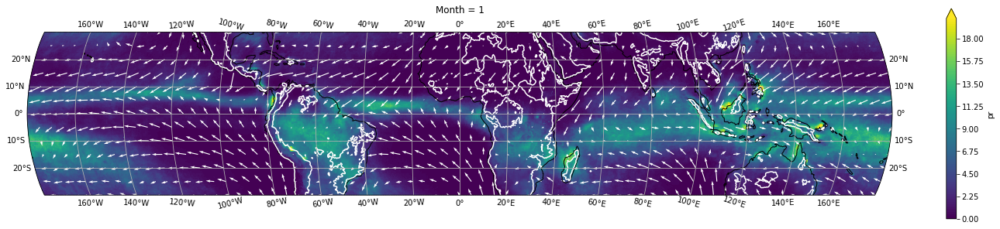

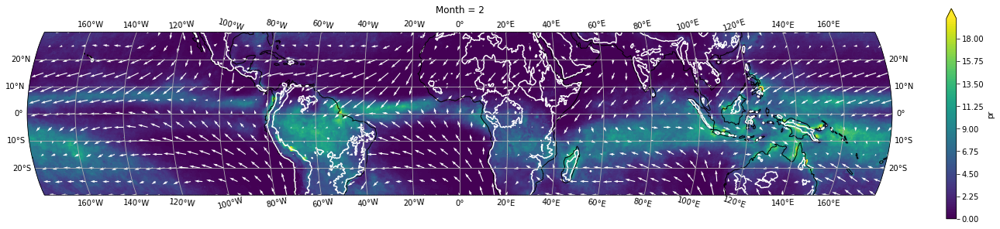

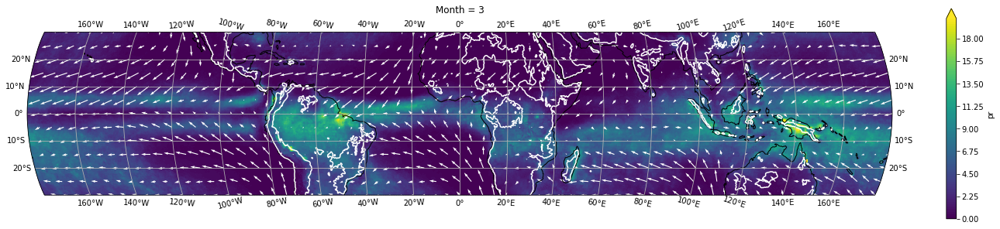

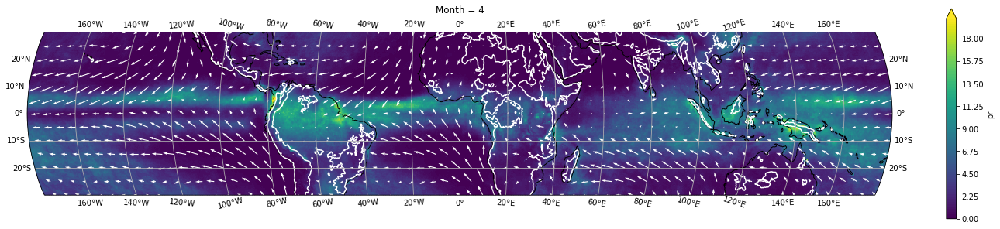

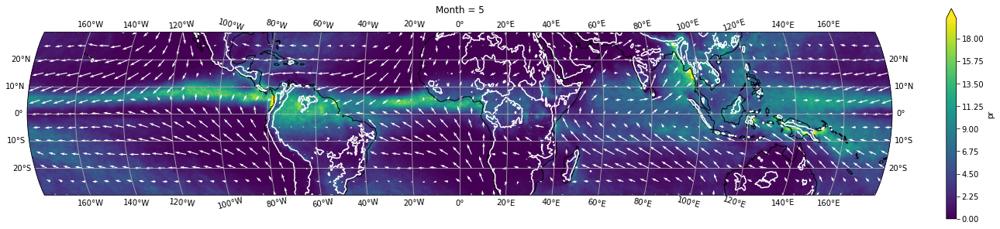

...

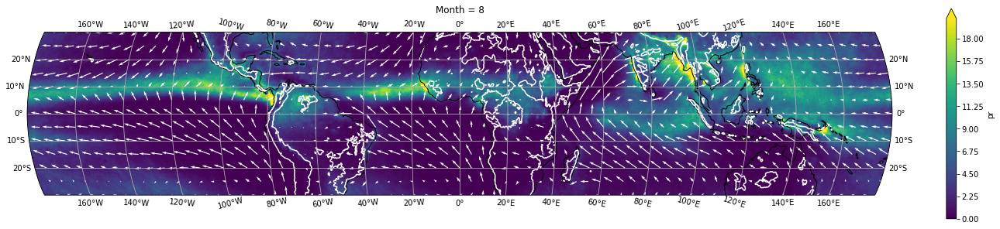

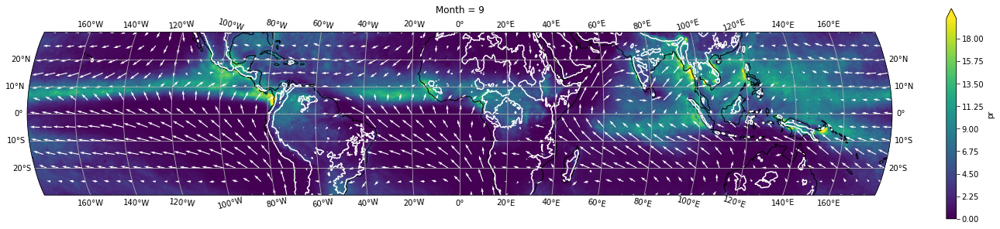

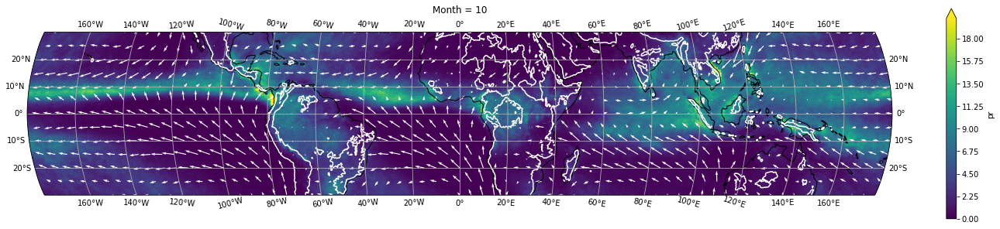

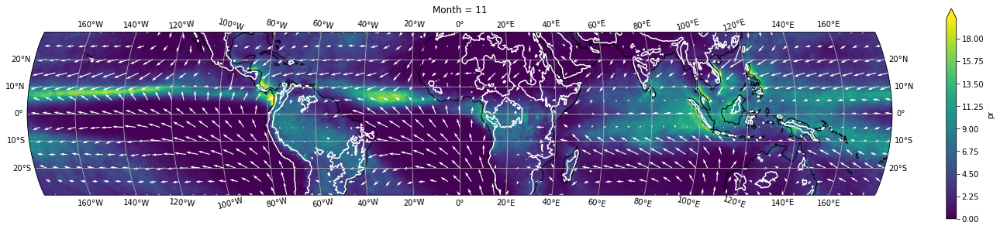

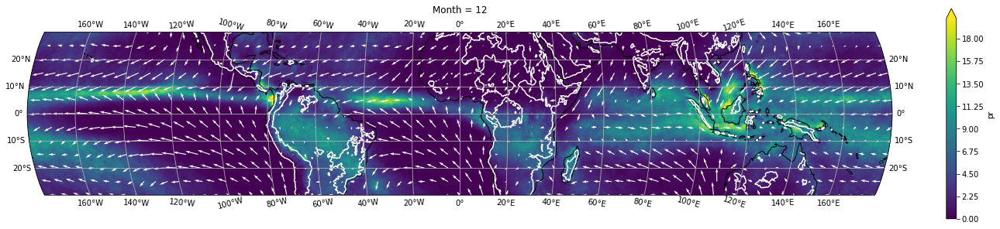

In [233]:
import matplotlib.ticker as mticker
maxlat=30

for mnth in range(1,13):
    fig,ax = plt.subplots(1,1,figsize=(25,5),subplot_kw={"projection":ccrs.Robinson()})
    ax.coastlines()
    trmmpr.sel(month=mnth,latitude=slice(maxlat,-maxlat)).plot(ax=ax,transform=ccrs.PlateCarree(),levels=np.linspace(0,20,81))
    orogm.sel(latitude=slice(maxlat,-maxlat)).plot.contour(ax=ax,transform=ccrs.PlateCarree(),**{'levels':[500],'colors':['w']})
    
    u=u100.sel(month=mnth,latitude=slice(maxlat,-maxlat))
    v=v100.sel(month=mnth,latitude=slice(maxlat,-maxlat))
    X = u.latitude.expand_dims({"longitude":u.longitude}).transpose()
    Y = u.longitude.expand_dims({"latitude":u.latitude})
    n=20
    m=n
    ax.quiver(np.array(Y)[::n,::m],np.array(X)[::n,::m], np.array(u)[::n,::m], np.array(v)[::n,::m], transform=ccrs.PlateCarree(),color="w",width=0.001,scale=600)
    ax.set_title("Month = %i"%mnth)
    
    gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    gl.xlocator = mticker.FixedLocator(range(-180,181,20))
    

# Data loading

## Monthly

In [6]:
#trmmpr=xr.open_dataset("/global/cscratch1/sd/wboos/data/trmm/pr_TRMM-L3_v7-7A_199801-201312.nc").pr.rename({'lat':'latitude','lon':'longitude'})
#trmmpr.coords['longitude'] = trmmpr.coords['longitude'] % 360
#trmmpr = trmmpr.sortby(trmmpr.longitude)
#trmmpr = trmmpr.reindex(latitude=list(reversed(trmmpr.latitude)))
#trmmpr = 86400*trmmpr.groupby("time.month").mean("time")
trmmpr=xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/TRMM-seasonalmean-20006-201312.nc")
gpm_pr=xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/GPM-IMERG-seasonalmean-20006-201312.nc")

In [7]:
era5pr = 1000*e5_climatology('128_228_tp', years=range(2000,2014))
era5e  = 1000*e5_climatology('128_182_e',  years=range(2000,2014))
era5cape =    e5_climatology('*_cape',     years=range(2000,2014))
era5100u =    e5_climatology("*_100u",     years=range(2000,2014))
era5100v =    e5_climatology("*_100v",     years=range(2000,2014))
era5sst  =    e5_climatology("*_sstk",     years=range(2000,2014))
era5cin  =    e5_climatology('228_001_cin',years=range(2000,2014))

9.765438795089722
5.537130355834961
5.182060718536377
7.202954292297363
6.062160968780518
7.80363917350769


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


3.826979160308838


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [8]:
def sel_rotate(var,box,angle,mnth):
    """Computes rotated means of a given variable"""
    window=var.sel(longitude=slice(box[0],box[1]),latitude=slice(box[3],box[2]))
    if "month" in var.dims:
        window=window.sel(month=mnth)
    return rotate(np.array(window)[::-1],90-angle,reshape=False,cval=np.nan)

def rotate3d(var,angle):
    return rotate(np.array(var)[:,::-1,:],90-angle,axes=(2,1),reshape=False,cval=np.nan)


def crossslopeflow(u,v,angle):
    return (u*np.sin(angle*np.pi/180)+v*np.cos(angle*np.pi/180))

In [20]:
#surface data
mnthmean_vars_rotated={name : {} for name in mountains}
for name in mountains:
    for varname,var in zip(['trmmpr','gpm_pr','128_129_z','128_228_tp','128_182_e','128_059_cape','228_246_100u','228_247_100v','128_034_sstk','228_001_cin'],[trmmpr,gpm_pr,orogm,era5pr,era5e,era5cape,era5100u,era5100v,era5sst,era5cin]):
        mnthmean_vars_rotated[name][varname] = sel_rotate(var  ,mountains[name][0],mountains[name][2],mountains[name][3])
    mnthmean_vars_rotated[name]['uperp'] = crossslopeflow(mnthmean_vars_rotated[name]['228_246_100u'],
                                                          mnthmean_vars_rotated[name]['228_247_100v'],
                                                          mountains[name][2])
        
        

In [70]:
%%time
mnthmean_3dvars={name : {} for name in mountains}
for name in mountains:
    box,_,_,mnth = mountains[name]
    for varname in ['128_131_u','128_132_v','128_135_w']:
        mnthmean_3dvars[name][varname] = e5_climatology(varname,years=range(2010,2011),box=box,level=None,chunks=None,month=mnth)
    mnthmean_3dvars[name]["uperp3d"] = crossslopeflow(mnthmean_3dvars[name]['128_131_u'],
                                                      mnthmean_3dvars[name]['128_132_v'],
                                                      mountains[name][2])

12.05676007270813
12.69276738166809
12.207940816879272
12.544574737548828
12.923962116241455
12.057315349578857
11.971319437026978
14.10349702835083
11.756469488143921
11.014717817306519
13.948574781417847
13.315890789031982
10.21959400177002
11.385458946228027
11.88285493850708
10.619183778762817
12.03728699684143
11.504180431365967
10.339258909225464
11.730609655380249
11.216262817382812
10.385220289230347
12.252865552902222
11.6033034324646
CPU times: user 3min 44s, sys: 58.7 s, total: 4min 43s
Wall time: 4min 49s


In [10]:
%%time
# Data for skew-ts
mnthmean_3dvars={name : {} for name in mountains}
for name in mountains:
    box,_,_,mnth = mountains[name]
    for varname in ['128_130_t','128_133_q']:
        mnthmean_3dvars[name][varname] = e5_climatology(varname,years=range(2000,2014),box=box,level=None,chunks=None,month=mnth)


166.246666431427
153.59179210662842
164.84721326828003
154.75749969482422
166.3295304775238
154.44301533699036
161.31745624542236
152.09170627593994
161.97936844825745
155.6040666103363
170.21291995048523
161.29302716255188
163.94047117233276
158.0878083705902
167.44275951385498
157.37440252304077
CPU times: user 34min 23s, sys: 8min 19s, total: 42min 43s
Wall time: 43min 24s


In [11]:
for name in mountains:
    for varname in ['128_130_t','128_133_q']:
        mnthmean_3dvars[name][varname].to_netcdf('/global/cscratch1/sd/qnicolas/temp/e5.climatology.%s.%s.2000-2013.nc'%(varname,name))

In [97]:
# Data for skew-ts
mnthmean_skewtdata={name : {varname : spatial_mean(mnthmean_3dvars[name][varname],box=mountains_upstream[name]).compute() for varname in ['128_130_t','128_133_q','128_135_w']} for name in mountains}
for name in mountains:
    mnthmean_skewtdata[name]['128_034_sstk'] = spatial_mean(era5sst.sel(month=mountains[name][3]),box=mountains_upstream[name]).compute()
    mnthmean_skewtdata[name]['128_059_cape'] = spatial_mean(era5cape.sel(month=mountains[name][3]),box=mountains_upstream[name]).compute()

In [144]:
mnthmean_skewtd={name : {varname : spatial_mean(mnthmean_3dvars[name][varname],box=mountains_dupstream[name]).compute() for varname in ['128_130_t','128_133_q','128_135_w']} for name in mountains}
mnthmean_skewtu={name : {varname : spatial_mean(mnthmean_3dvars[name][varname],box=mountains_uupstream[name]).compute() for varname in ['128_130_t','128_133_q','128_135_w']} for name in mountains}


In [286]:
#trmmpr_seasmean={}
#era5pr_seasmean={}
#for i,name in enumerate(mountains):
#    trmmpr_seasmean[name] = spatial_mean(trmmpr,mountains[name][0])
#    era5pr_seasmean[name] = spatial_mean(era5pr,mountains[name][0])


## Precip extremes

In [346]:
%%time
#pr_timeseries={name : xr.open_dataarray(glob.glob(os.path.join(SCRATCH+'processedData/precipCrossSections/',"e5.128_228_tp.daily.%s*.nc"%name))[0]) for name in mountains}
pr_timeseries = e5_timeseries_precip({k:(mountains_above[k],v[3]) for k,v in mountains.items()},SCRATCH+'processedData/precipCrossSections/',years=(1998,2014))

Estimated computing time (rough estimate for 10° square boxes, assuming all months taken) : < 256 s
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 CPU times: user 2.94 s, sys: 4.04 s, total: 6.97 s
Wall time: 40.4 s


In [348]:
%%time
allvars=['128_135_w','128_228_tp','228_246_100u','228_247_100v','128_059_cape']

extreme_vars={name : {} for name in pr_timeseries}
for name in pr_timeseries:
    days = extreme_days(pr_timeseries[name],99)
    extreme_vars[name]['trmmpr'] = trmm_get_pr(days,mountains[name][0]).mean('time')
    extreme_vars[name]['trmmpr'].to_netcdf(SCRATCH+'processedData/precipCrossSections/trmm.pr.%s.tp99mean.nc'%name)
    for var in allvars:
        extreme_vars[name][var] = e5_get_extreme(pr_timeseries[name],99,mountains[name][0],var,tdisc=6).mean('time')
        extreme_vars[name][var].to_netcdf(SCRATCH+'processedData/precipCrossSections/e5.%s.%s.tp99mean.nc'%(var,name))

#extreme_vars={name : {var : xr.open_dataarray(SCRATCH+'processedData/precipCrossSections/e5.%s.*%s.tp99mean.nc'%(var,name)) for var in allvars} for name in mountains}
#for name in extreme_vars :
#    extreme_vars[name]['trmmpr']=xr.open_dataarray(SCRATCH+'processedData/precipCrossSections/trmm.pr.*%s.tp99mean.nc'%name)
    

Estimated computing time (if surface variable) : 1.2 s
First level : 1 hPa
Estimated computing time : 1.0 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
First level : 1 hPa
Estimated computing time : 1.0 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
First level : 1 hPa
Estimated computing time : 1.0 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
First level : 1 hPa
Estimated computing time : 1.0 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computin

In [349]:
extreme_vars_rotated={name : {} for name in mountains}
for name in mountains:
    for var in extreme_vars[name].keys():
        angle=mountains[name][2]
        if 'level' in extreme_vars[name][var].coords:
            extreme_vars_rotated[name][var] = rotate3d(extreme_vars[name][var],angle)
        else:
            extreme_vars_rotated[name][var] = rotate(np.array(extreme_vars[name][var])[::-1],90-angle,reshape=False,cval=np.nan)
        

## Upslope extremes

In [355]:
u100_timeseries = e5_timeseries_sfc('228_246_100u',{k:(mountains_upstream[k],v[3]) for k,v in mountains.items()},SCRATCH+'processedData/precipCrossSections/',space_mean=False,years=(1998,2014))
v100_timeseries = e5_timeseries_sfc('228_247_100v',{k:(mountains_upstream[k],v[3]) for k,v in mountains.items()},SCRATCH+'processedData/precipCrossSections/',space_mean=False,years=(1998,2014))
#u100_timeseries={name : xr.open_dataarray(glob.glob(os.path.join(SCRATCH+'processedData/precipCrossSections/',"e5.228_246_100u.daily.%s*.nc"%name))[0]) for name in mountains}
#v100_timeseries={name : xr.open_dataarray(glob.glob(os.path.join(SCRATCH+'processedData/precipCrossSections/',"e5.228_247_100v.daily.%s*.nc"%name))[0]) for name in mountains}


Estimated computing time (rough estimate for 10° square boxes, assuming all months taken) : < 384 s
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 Estimated computing time (rough estimate for 10° square boxes, assuming all months taken) : < 384 s
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

In [356]:

upslopeflow_timeseries = {name : crossslopeflow(u100_timeseries[name],v100_timeseries[name],mountains_upstream[name][2]).mean(['latitude','longitude']) for name in mountains_upstream}



In [357]:
%%time
upsextreme_vars={name : {} for name in mountains}
for name in mountains:
    try :
        days = extreme_days(upslopeflow_timeseries[name],99)
        upsextreme_vars[name]['trmmpr'] = trmm_get_pr(days,mountains[name][0]).mean('time')
        upsextreme_vars[name]['trmmpr'].to_netcdf(SCRATCH+'processedData/precipCrossSections/trmm.pr.*%s.upslope99mean.nc'%name)
    except ValueError:
        print("FAIL")
        pass
    for var in allvars:
        upsextreme_vars[name][var] = e5_get_extreme(upslopeflow_timeseries[name],99,mountains[name][0],var,tdisc=6).mean('time')
        upsextreme_vars[name][var].to_netcdf(SCRATCH+'processedData/precipCrossSections/e5.%s.*%s.upslope99mean.nc'%(var,name))

#upsextreme_vars={name : {var : xr.open_dataarray(SCRATCH+'processedData/precipCrossSections/e5.%s.*%s.upslope99mean.nc'%(var,name)) for var in allvars} for name in mountains}
#for name in extreme_vars :
#    extreme_vars[name]['trmmpr']=xr.open_dataarray(SCRATCH+'processedData/precipCrossSections/trmm.pr.*%s.tp99mean.nc'%name)
    


20101004 does not exist in TRMM
Estimated computing time (if surface variable) : 1.2 s
First level : 1 hPa
Estimated computing time : 1.0 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
First level : 1 hPa
Estimated computing time : 1.0 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
First level : 1 hPa
Estimated computing time : 1.0 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
Estimated computing time (if surface variable) : 1.2 s
First level : 1 hPa
Estimated computing time : 1.0 s
Estimated computing time (if surface vari

In [358]:
upsextreme_vars_rotated={name : {} for name in mountains}
for name in mountains:
    for var in upsextreme_vars[name].keys():
        angle=mountains[name][2]
        if 'level' in upsextreme_vars[name][var].coords:
            upsextreme_vars_rotated[name][var] = rotate3d(upsextreme_vars[name][var],angle)
        else:
            upsextreme_vars_rotated[name][var] = rotate(np.array(upsextreme_vars[name][var])[::-1],90-angle,reshape=False,cval=np.nan)
        

# Monthly means

## Maps

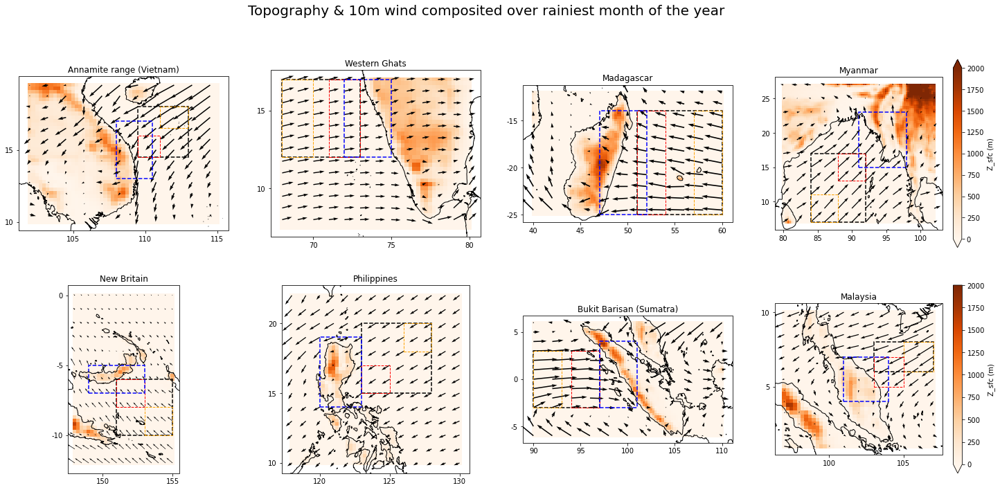

In [143]:
fig,ax = plt.subplots(2,4,figsize=(25,11),subplot_kw={"projection":ccrs.PlateCarree()})
ax = ax.reshape(-1)
for i,name in enumerate(mountains):
    box,Lname,_,mnth = mountains[name]
    ax[i].coastlines()
    window=orogm.sel(longitude=slice(box[0],box[1]),latitude=slice(box[3],box[2]))
    if i%4!=3:
        window.plot(ax=ax[i],transform=ccrs.PlateCarree(),cmap=plt.cm.Oranges,vmin=0.,vmax=2000.,add_colorbar=False)
    else:
        window.plot(ax=ax[i],transform=ccrs.PlateCarree(),cmap=plt.cm.Oranges,vmin=0.,vmax=2000.,cbar_kwargs={'label':'Z_sfc (m)'})
    ax[i].set_title(Lname)
    
    u=era5100u.sel(month=mnth,longitude=slice(box[0],box[1]),latitude=slice(box[3],box[2]))
    v=era5100v.sel(month=mnth,longitude=slice(box[0],box[1]),latitude=slice(box[3],box[2]))
    X = u.latitude.expand_dims({"longitude":u.longitude}).transpose()
    Y = u.longitude.expand_dims({"latitude":u.latitude})
    n=len(u.latitude)//10
    m=len(u.longitude)//10
    ax[i].quiver(np.array(Y)[::n,::m],np.array(X)[::n,::m], np.array(u)[::n,::m], np.array(v)[::n,::m], transform=ccrs.PlateCarree(),color="k")
    
    #Boxes
    smallbox = mountains_upstream[name]
    ax[i].add_patch(mpatches.Rectangle(xy=[smallbox[0], smallbox[2]], width=smallbox[1]-smallbox[0], height=smallbox[3]-smallbox[2],
                                       edgecolor='k',
                                       fill = False,
                                       lw=1.5,
                                       linestyle='--',
                                       transform=ccrs.PlateCarree())
                    )
    smallbox = mountains_uupstream[name]
    ax[i].add_patch(mpatches.Rectangle(xy=[smallbox[0], smallbox[2]], width=smallbox[1]-smallbox[0], height=smallbox[3]-smallbox[2],
                                       edgecolor='orange',
                                       fill = False,
                                       lw=1,
                                       linestyle='--',
                                       transform=ccrs.PlateCarree())
                    )
    smallbox = mountains_dupstream[name]
    ax[i].add_patch(mpatches.Rectangle(xy=[smallbox[0], smallbox[2]], width=smallbox[1]-smallbox[0], height=smallbox[3]-smallbox[2],
                                       edgecolor='r',
                                       fill = False,
                                       lw=1,
                                       linestyle='--',
                                       transform=ccrs.PlateCarree())
                    )
    
    smallbox = mountains_above[name]
    ax[i].add_patch(mpatches.Rectangle(xy=[smallbox[0], smallbox[2]], width=smallbox[1]-smallbox[0], height=smallbox[3]-smallbox[2],
                                       edgecolor='b',
                                       fill = False,
                                       lw=1.5,
                                       linestyle='--',
                                       transform=ccrs.PlateCarree())
                    ) 
    
    dl=5
    lons=range(dl*(1+(int(box[0])-1)//dl),dl*(int(box[1])//dl)+1,dl)
    ax[i].set_xticks(lons)
    ax[i].set_xticklabels(lons)
    lats=range(dl*(1+(int(box[2])-1)//dl),dl*(int(box[3])//dl)+1,dl)
    ax[i].set_yticks(lats)
    ax[i].set_yticklabels(lats)
    ax[i].set_xlabel("")
    ax[i].set_ylabel("")
    
fig.suptitle("Topography & 10m wind composited over rainiest month of the year",fontsize=20);None

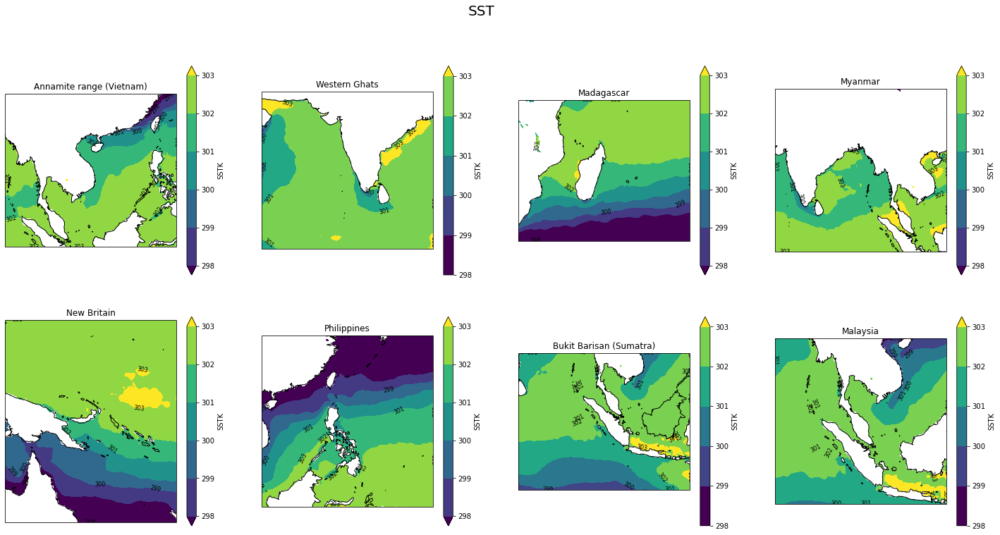

In [528]:
fig,ax = plt.subplots(2,4,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
ax = ax.reshape(-1)
for i,name in enumerate(mountains):
    box,Lname,_,mnth = mountains[name]
    box=np.array(box)+np.array([-10,10,-10,10])
    ax[i].coastlines()
    window=era5sst.sel(longitude=slice(box[0],box[1]),latitude=slice(box[3],box[2])).sel(month=mnth)
    contourf=window.plot.contourf(ax=ax[i],transform=ccrs.PlateCarree(),levels=np.arange(298,304,1))
    ax[i].clabel(contourf, inline=False, fontsize=8, fmt="%i",colors='k')
    ax[i].set_title(Lname)

fig.suptitle("SST",fontsize=20);None

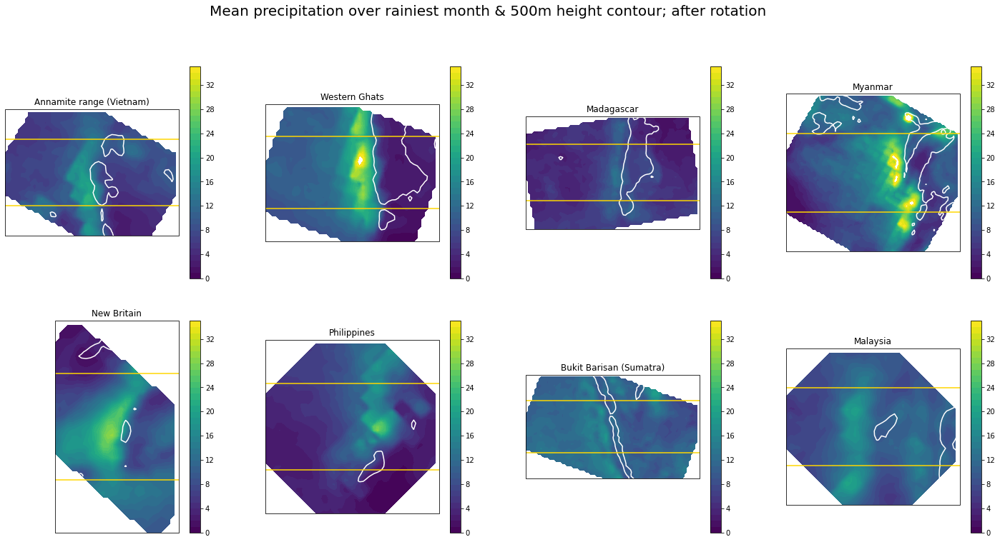

In [402]:
fig,ax = plt.subplots(2,4,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
ax = ax.reshape(-1)
for i,name in enumerate(mountains):
    im=ax[i].contourf(mnthmean_vars_rotated[name]['trmmpr'],cmap=plt.cm.viridis,levels=np.arange(0,36,1))
    ax[i].contour(mnthmean_vars_rotated[name]['128_129_z'],**{'levels':[500],'colors':['w']})
    ax[i].set_title(mountains[name][1])
    n=len(mnthmean_vars_rotated[name]['128_129_z'])
    ax[i].axhline(n//4,color="gold")
    ax[i].axhline(3*n//4,color="gold")
    fig.colorbar(im, ax=ax[i])
    
fig.suptitle("Mean precipitation over rainiest month & 500m height contour; after rotation",fontsize=20);None

## Cross-slope plots

In [18]:
def set_plots(mountains):
    fig,ax = plt.subplots(2,4,figsize=(25,12))
    ax = ax.reshape(-1)
    mountaintops=[800.,900.,1350.,1700.,450.,850.,1100.,600.]
    for i,name in enumerate(mountains):
        ax[i].set_title(mountains[name][1])

        n,m=mnthmean_vars_rotated[name]['128_129_z'].shape
        ax[i].plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],np.nanmean(mnthmean_vars_rotated[name]['128_129_z'][n//4:3*n//4,:],axis=0),color='k',label='orog')
        ax[i].set_xlabel("distance(km)")
        ax[i].set_ylabel("height(m)/ CAPE (J/kg)")
        
        ax[i].set_ylim(-20,2020)
    return fig,ax



In [15]:
hrchannel10_300precip = xr.open_dataarray("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.precip.days0-200.nc").isel(Time=slice(200,800)).mean(['Time','south_north'])
hrchannel10_300 = xr.open_dataset(glob.glob("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/wrfout_d01_197*")[0])
hrhgt = hrchannel10_300.HGT.isel(south_north=0,Time=-1).persist()
hrdist=(1635-hrhgt.west_east)*3

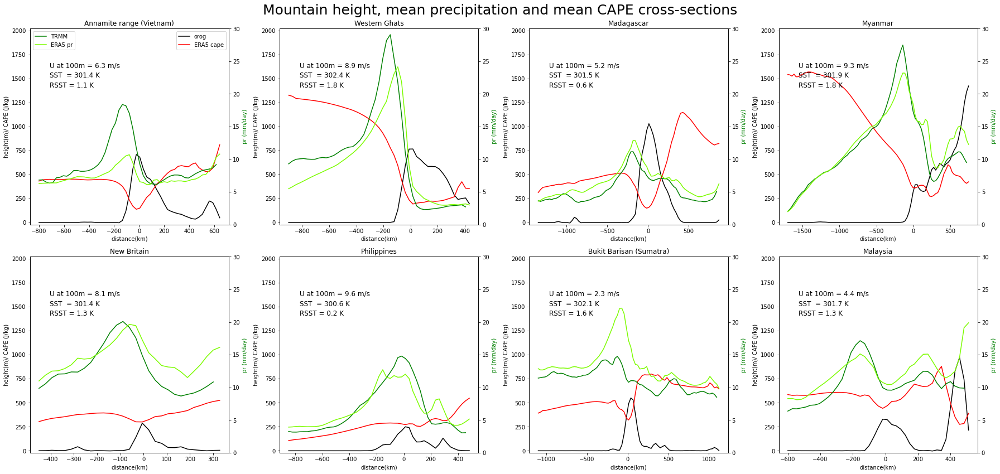

In [69]:
fig,ax=set_plots(mountains)
mountaintops=[800.,900.,1350.,1700.,450.,850.,1100.,600.]
for i,name in enumerate(mountains):
    ax2=ax[i].twinx()
    ax2.set_ylabel('pr (mm/day)', color='g')
    n,m=mnthmean_vars_rotated[name]['trmmpr'].shape
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],np.nanmean(mnthmean_vars_rotated[name]['trmmpr'][n//4:3*n//4,:],axis=0),'g',label='TRMM')
    
    n,m=mnthmean_vars_rotated[name]['128_228_tp'].shape
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],np.nanmean(mnthmean_vars_rotated[name]['128_228_tp'][n//4:3*n//4,:],axis=0),color='lawngreen',label='ERA5 pr')
    
    n,m=mnthmean_vars_rotated[name]['128_059_cape'].shape
    ax[i].plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],np.nanmean(mnthmean_vars_rotated[name]['128_059_cape'][n//4:3*n//4,:],axis=0),'r',label='ERA5 cape')

    #a=1635-int(np.arange(0,10000,0.25*km_per_degreelat)[m-1]-mountaintops[i])//3;b=1635+int(mountaintops[i])//3
    #ax[i].plot(hrdist[a:b],hrhgt[a:b],color='k',linestyle='--',label='WRF orog')
    #ax2.plot(hrdist[a:b],hrchannel10_300precip[a:b],color='g',linestyle='--',label='WRF precip')
    
    if i == 0:
        ax[i].legend()
        ax2.legend(loc="upper left")
    ax2.set_ylim(0,30)
    
    b = int((mountaintops[i]-500)/(0.25*km_per_degreelat))
    a = int((mountaintops[i]-750)/(0.25*km_per_degreelat))
    
    if a<=0:
        a=0
        b = int((mountaintops[i]-300)/(0.25*km_per_degreelat))
    
    ax2.text(0.1, 0.8,'U at 100m = %.1f m/s'%np.nanmean(np.maximum(mnthmean_vars_rotated[name]['uperp'][n//4:3*n//4,a:b],0.)), transform=ax2.transAxes, fontsize=12)
    sst = spatial_mean(era5sst.sel(month=mountains[name][3]),box=mountains_upstream[name])
    tropmean = spatial_mean(era5sst.sel(month=mountains[name][3],latitude=slice(20,-20)))
    ax2.text(0.1, 0.75,'SST  = %.1f K'%float(sst), transform=ax2.transAxes, fontsize=12)
    ax2.text(0.1, 0.7, 'RSST = %.1f K'%float(sst-tropmean), transform=ax2.transAxes, fontsize=12)
        
fig.suptitle("Mountain height, mean precipitation and mean CAPE cross-sections",fontsize=25)
fig.tight_layout()



Text(0, 0.5, 'pr (mm/day)')

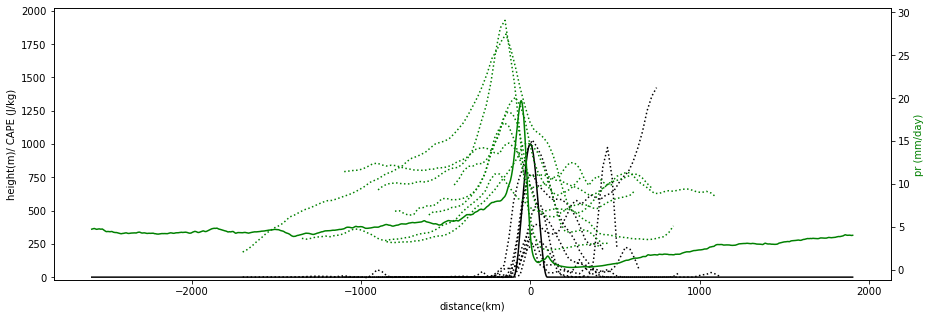

In [25]:

fig,ax=plt.subplots(1,1,figsize=(15,5))
ax2=ax.twinx()
for i,name in enumerate(mountains):
    n,m=mnthmean_vars_rotated[name]['128_129_z'].shape
    ax.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],np.nanmean(mnthmean_vars_rotated[name]['128_129_z'][n//4:3*n//4,:],axis=0),color='k',label='orog',linestyle=':')
    
    n,m=mnthmean_vars_rotated[name]['trmmpr'].shape
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],np.nanmean(mnthmean_vars_rotated[name]['trmmpr'][n//4:3*n//4,:],axis=0),'g',label='TRMM',linestyle=':')

a=1000;b=2500
ax.plot(hrdist[a:b],hrhgt[a:b],color='k',label='orog')
ax2.plot(hrdist[a:b],hrchannel10_300precip[a:b],color='g',label='orog')
    
    
ax.set_xlabel("distance(km)")
ax.set_ylabel("height(m)/ CAPE (J/kg)")
ax.set_ylim(-20,2020)
ax2.set_ylabel('pr (mm/day)', color='g')



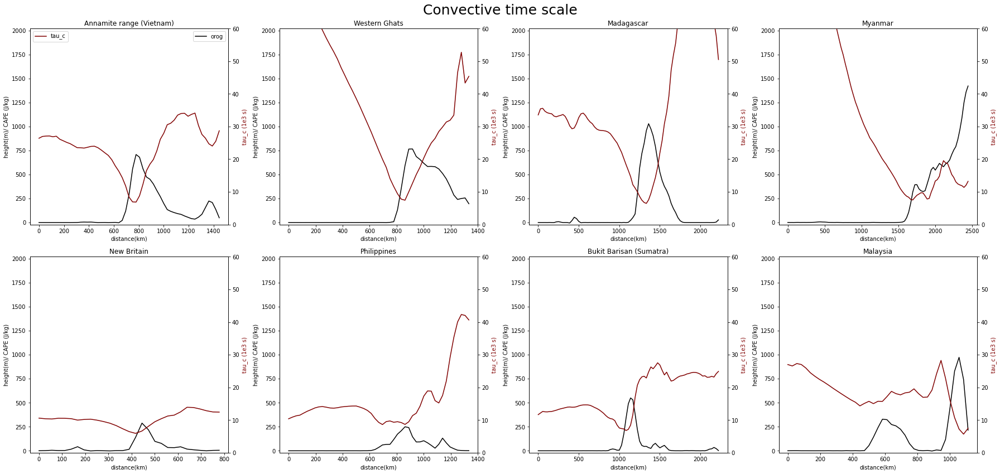

In [314]:
fig,ax=set_plots(mountains)
for i,name in enumerate(mountains):
    ax2=ax[i].twinx()
    ax2.set_ylabel('tau_c (1e3 s)', color='maroon')
    
    n,m=mnthmean_vars_rotated[name]['128_228_tp'].shape
    pr = np.nanmean(mnthmean_vars_rotated[name]['128_228_tp'][n//4:3*n//4,:],axis=0)
    cape = np.nanmean(mnthmean_vars_rotated[name]['128_059_cape'][n//4:3*n//4,:],axis=0)
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],86400*1e4*cape/pr/2.26e6 / 1000,color='maroon',label='tau_c')

    if i == 0:
        ax[i].legend()
        ax2.legend(loc="upper left")
    ax2.set_ylim(0,60)
    
fig.suptitle("Convective time scale",fontsize=25)
fig.tight_layout()



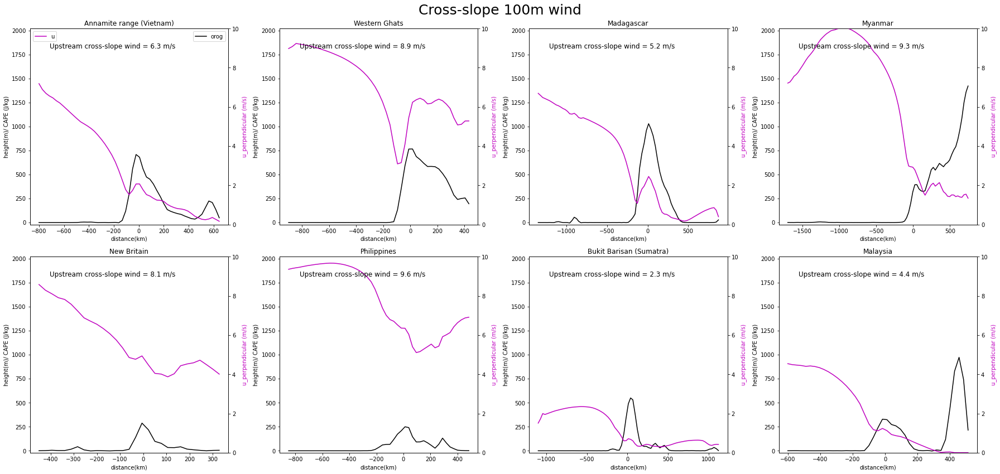

In [61]:
fig,ax=set_plots(mountains)
for i,name in enumerate(mountains):
    ax2=ax[i].twinx()
    ax2.set_ylabel('u_perpendicular (m/s)', color='m')
    
    n,m=mnthmean_vars_rotated[name]['uperp'].shape
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],np.nanmean(np.maximum(mnthmean_vars_rotated[name]['uperp'][n//4:3*n//4,:],0.),axis=0),color='m',label='u')

    if i == 0:
        ax[i].legend()
        ax2.legend(loc="upper left")
    ax2.set_ylim(0,10)
    
    b = int((mountaintops[i]-500)/(0.25*km_per_degreelat))
    a = int((mountaintops[i]-750)/(0.25*km_per_degreelat))
    
    if a<=0:
        a=0
        b = int((mountaintops[i]-300)/(0.25*km_per_degreelat))
    
    ax2.text(0.1, 0.9,'Upstream cross-slope wind = %.1f m/s'%np.nanmean(np.maximum(mnthmean_vars_rotated[name]['uperp'][n//4:3*n//4,a:b],0.)), transform=ax2.transAxes, fontsize=12)
    
fig.suptitle("Cross-slope 100m wind",fontsize=25)
fig.tight_layout()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  


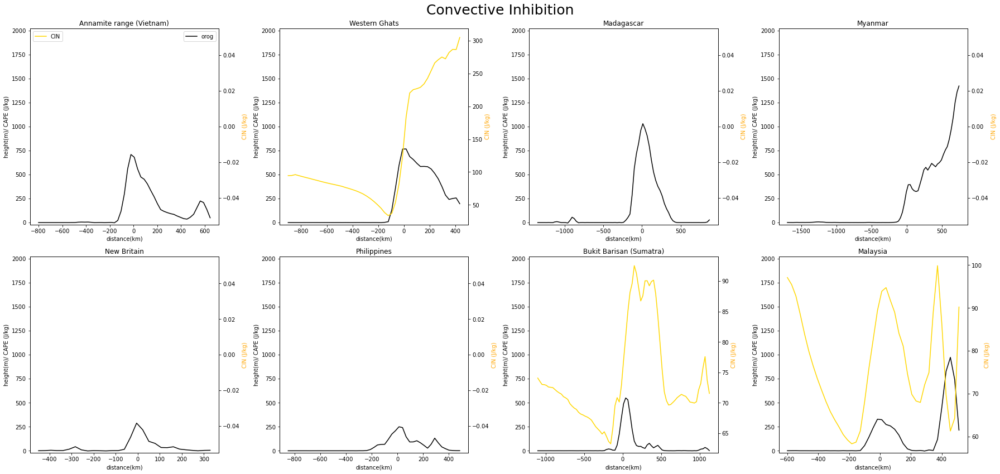

In [124]:
fig,ax=set_plots(mountains)
for i,name in enumerate(mountains):
    ax2=ax[i].twinx()
    ax2.set_ylabel('CIN (J/kg)', color='orange')
    n,m=mnthmean_vars_rotated[name]['228_001_cin'].shape
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],np.nanmean(mnthmean_vars_rotated[name]['228_001_cin'][n//4:3*n//4,:],axis=0),color='gold',label='CIN')

    if i == 0:
        ax[i].legend()
        ax2.legend(loc="upper left")
    #ax2.set_ylim(0,10)

fig.suptitle("Convective Inhibition",fontsize=25)
fig.tight_layout()

## Cross-slope / level plots

In [94]:
def plot_xz(vardict,mountains,levels=None,description="",labels=False,title=""): 
    fig,ax = plt.subplots(2,4,figsize=(25,11))
    ax=ax.reshape(-1)
    for i,name in enumerate(mountains):
        var_rot=rotate3d(vardict[name],mountains[name][2])
        
        p,n,m = var_rot.shape
        
        x=np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i]
        var_xz = xr.DataArray(np.nanmean(var_rot[:,n//4:3*n//4,:],axis=1),
                                  dims  ={'level':vardict[name].level,'Cross-slope distance (km)':x},
                                  coords={'level':vardict[name].level,'Cross-slope distance (km)':x})
        if i%4!=3:
            contourf=var_xz.plot.contourf(ax=ax[i],yincrease=False,levels=levels,add_colorbar=False)
        else:
            contourf=var_xz.plot.contourf(ax=ax[i],yincrease=False,levels=levels,cbar_kwargs={'ticks':np.arange(-0.025,0.026,0.005)})
        if labels:
            ax[i].clabel(contourf, inline=False, fontsize=8, fmt="%i",colors='k')
        
        n,m=mnthmean_vars_rotated[name]['128_129_z'].shape
        ax[i].plot(x,999-np.nanmean(mnthmean_vars_rotated[name]['128_129_z'][n//4:3*n//4,:],axis=0)/10,color='k')   
        ax[i].set_title(mountains[name][1]+description)
    fig.suptitle(title,fontsize=18)
    fig.subplots_adjust(top=0.93)


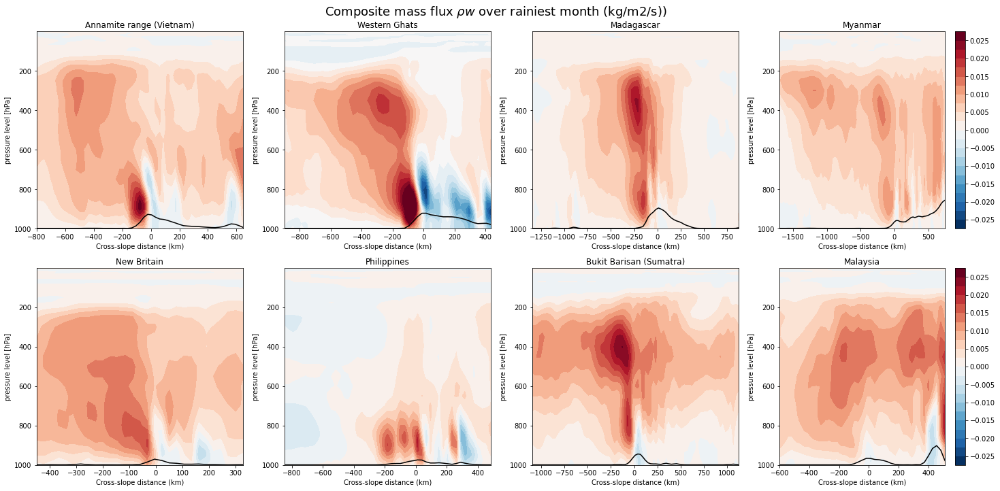

In [95]:
plot_xz({name :-mnthmean_3dvars[name]['128_135_w']/9.81 for name in mountains},mountains,levels=np.arange(-0.0275,0.03,0.0025),description="", title = r"Composite mass flux $\rho w$ over rainiest month (kg/m2/s))")

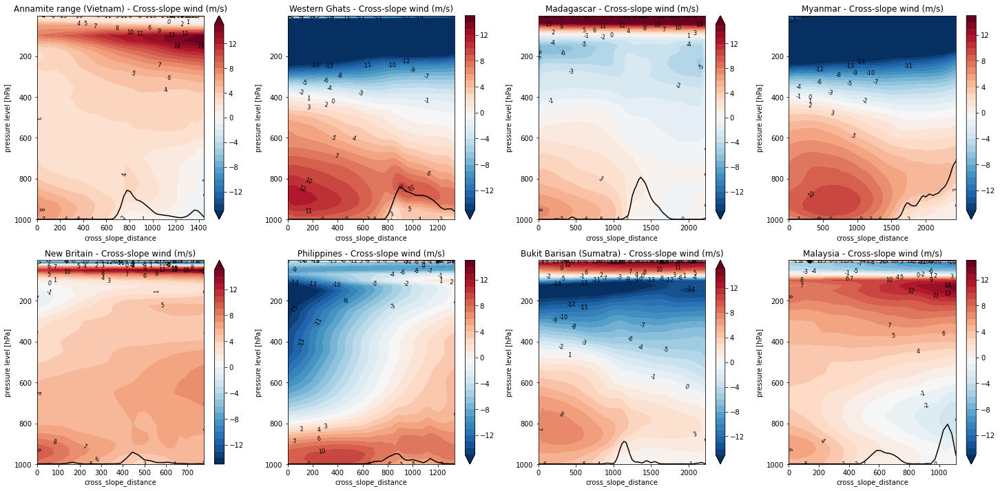

In [455]:
plot_xz({name :mnthmean_3dvars[name]['uperp3d'] for name in mountains},mountains,levels=np.arange(-15,16,1),description=" - Cross-slope wind (m/s)",labels=True)

In [155]:
def plot_xz_anom(vardict,mountains,levels=None,description="",labels=False,title=""): 
    fig,ax = plt.subplots(2,4,figsize=(25,11))
    ax=ax.reshape(-1)
    for i,name in enumerate(mountains):
        var_rot=rotate3d(vardict[name],mountains[name][2])
        
        p,n,m = var_rot.shape
        
        x=np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i]
        var_xz = xr.DataArray(np.nanmean(var_rot[:,n//4:3*n//4,:],axis=1),
                                  dims  ={'level':vardict[name].level,'Cross-slope distance (km)':x},
                                  coords={'level':vardict[name].level,'Cross-slope distance (km)':x})
        var_xz=var_xz-var_xz.isel({'Cross-slope distance (km)':range(0,10)}).mean('Cross-slope distance (km)')
        if i%4!=3:
            contourf=var_xz.plot.contourf(ax=ax[i],yincrease=False,levels=levels,add_colorbar=False)
        else:
            contourf=var_xz.plot.contourf(ax=ax[i],yincrease=False,levels=levels)
        if labels:
            ax[i].clabel(contourf, inline=False, fontsize=8, fmt="%i",colors='k')
        
        n,m=mnthmean_vars_rotated[name]['128_129_z'].shape
        ax[i].plot(x,999-np.nanmean(mnthmean_vars_rotated[name]['128_129_z'][n//4:3*n//4,:],axis=0)/10,color='k')   
        ax[i].set_title(mountains[name][1]+description)
    fig.suptitle(title,fontsize=18)
    fig.subplots_adjust(top=0.93)


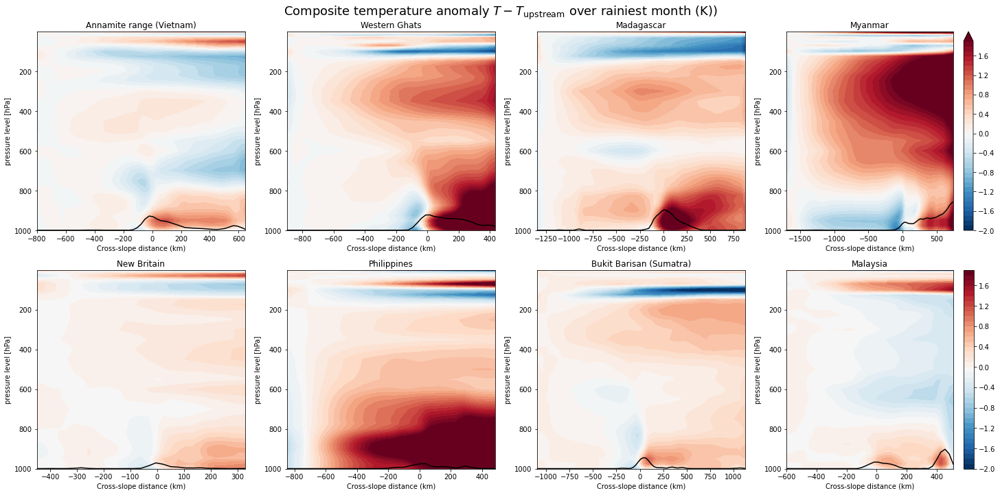

In [158]:
plot_xz_anom({name :mnthmean_3dvars[name]['128_130_t'] for name in mountains},mountains,description="",levels=np.arange(-2,2,0.1), title = r"Composite temperature anomaly $T-T_{\mathrm{upstream}}$ over rainiest month (K))")

## Skew-Ts

In [99]:
import warnings
def plot_skewt(T,q,plevs,skew,color="usual",lbl=None,plotcape=True):
    P = np.array(plevs)* units.hPa
    i=0
    Tups = units.degK*np.array(T)
    qups = np.array(q)

    P=P[::-1]
    Tups=Tups[::-1]
    qups=qups[::-1]

    
    
    Tdups = mpcalc.dewpoint_from_specific_humidity(qups,Tups,P)
    profups = mpcalc.parcel_profile(P, Tups[0], Tdups[0]).to('degC')
    if color=="usual":
        skew.plot(P, Tups,color="r" ,label=lbl)
        skew.plot(P, Tdups,color="b")
        skew.plot(P, profups, color="k", linewidth=2)
        skew.shade_cape(P, Tups, profups,color="r")
    else :
        skew.plot(P, Tups,color=color ,label=lbl)
        skew.plot(P, Tdups,color=color)
        if plotcape:
            skew.plot(P, profups, color=color, linewidth=2)
            skew.shade_cape(P, Tups, profups,color=color)
            
    return mpcalc.cape_cin(P, Tups, Tdups,profups)[0]/units("J/kg")

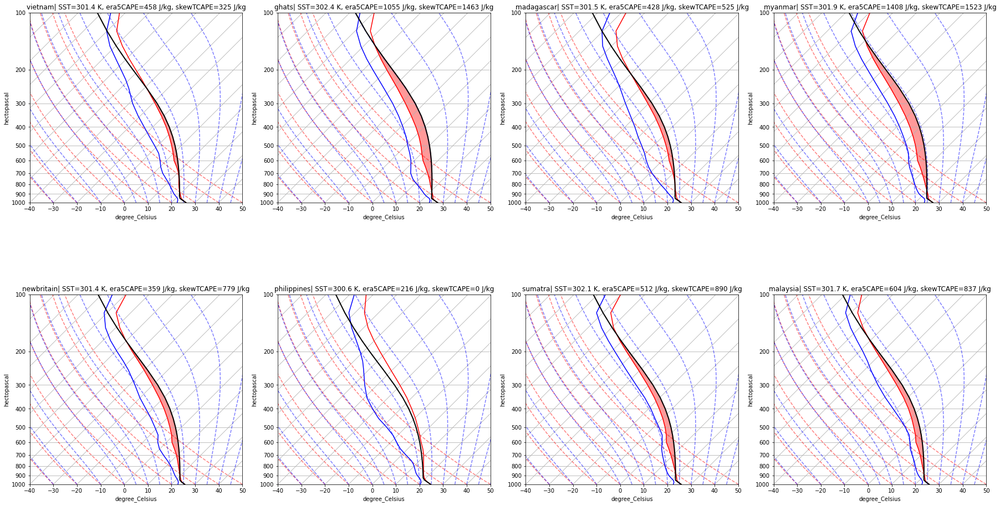

In [564]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore",RuntimeWarning)
    fig = plt.figure(figsize=(25,15))
    ax=ax.reshape(-1)
    for i,name in enumerate(mountains):
        skew = SkewT(fig, rotation=45,subplot=(2,4,i+1))
        skewtcape = plot_skewt(mnthmean_skewtdata[name]['128_130_t'],mnthmean_skewtdata[name]['128_133_q'],mnthmean_skewtdata[name]['128_130_t'].level,skew)
        
        skew.ax.set_ylim(1000, 100)
        skew.ax.set_xlim(-40, 50)
        skew.plot_dry_adiabats()
        skew.plot_moist_adiabats()
        skew.ax.set_title(name + "| SST=%.1f K, era5CAPE=%i J/kg, skewTCAPE=%i J/kg"%(mnthmean_skewtdata[name]['128_034_sstk'],mnthmean_skewtdata[name]['128_059_cape'],skewtcape),fontsize=12)
    fig.tight_layout()

In [108]:
plevs=np.array([100000,97500,95000,92500,90000,87500,85000,82500,80000,77500,75000,70000,65000,60000,55000,50000,45000,40000,35000,30000,25000,22500,20000,17500,15000,12500,10000,7000,5000,1000])/100
plevs=plevs[1:-4][::-1]

def extractwrfvar(path,exclude=False):
    var = xr.open_dataarray(path)
    var=var.where(var > -1.)  
    if exclude:
        return var.isel(west_east=slice(1750,2000)).mean('west_east')[::-1]
    else:
        return var.isel(west_east=slice(1750,2000)).mean('west_east')[1:-4][::-1]
    
def extractwrfvar(path,exclude=False):
    var = xr.open_dataarray(path)
    var=var.where(var > -1.)  
    if exclude:
        return var.isel(west_east=slice(1635+200//3,1635+500//3)).mean('west_east')[::-1]
    else:
        return var.isel(west_east=slice(1635+200//3,1635+500//3)).mean('west_east')[1:-4][::-1]

hrchannel10_T=extractwrfvar("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.T_PL.days50-200.nc")
hrchannel10_Q=extractwrfvar("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.Q_PL.days50-200.nc")
hrchannel3_T=extractwrfvar("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3mps.3km/diags/wrf.T_PL.days50-200.nc")
hrchannel3_Q=extractwrfvar("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3mps.3km/diags/wrf.Q_PL.days50-200.nc")

hrchannelwk_T=extractwrfvar("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.walker.3km/diags/wrf.T_PL.days50-200.nc",True)
hrchannelwk_Q=extractwrfvar("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.walker.3km/diags/wrf.Q_PL.days50-200.nc",True)

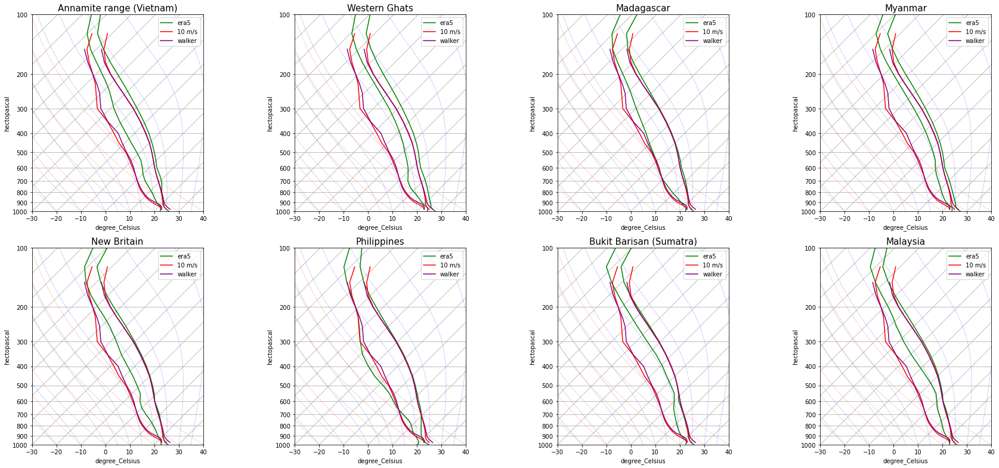

In [116]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore",RuntimeWarning)
    fig = plt.figure(figsize=(25,11))
    ax=ax.reshape(-1)
    for i,name in enumerate(mountains):
        skew = SkewT(fig, rotation=45,subplot=(2,4,i+1))
        skewtcape = plot_skewt(mnthmean_skewtdata[name]['128_130_t'],mnthmean_skewtdata[name]['128_133_q'],mnthmean_skewtdata[name]['128_130_t'].level,skew,"green","era5",False)
        skewtcape_wrf10 = plot_skewt(hrchannel10_T,hrchannel10_Q,plevs,skew,'red',"10 m/s",False)
        skewtcape_wrf3 = plot_skewt(hrchannelwk_T,hrchannelwk_Q,plevs,skew,'purple',"walker",False)
        #skewtcape_wrf3 = plot_skewt(hrchannel3_T,hrchannel3_Q,plevs,skew,'orange',"3 m/s",False)
        
        skew.ax.set_ylim(1000, 100)
        skew.ax.set_xlim(-30, 40)
        skew.plot_dry_adiabats(linewidth=0.5)
        skew.plot_moist_adiabats(linewidth=0.5)
        skew.ax.legend()
        skew.ax.set_title(mountains[name][1],fontsize=15)# + "| era5CAPE=%i J/kg"%skewtcape,fontsize=20)
    fig.tight_layout()
    
#print("WRF - 10m/s - skewT CAPE : %i J/kg"%skewtcape_wrf10)
#print("WRF - 3m/s - skewT CAPE : %i J/kg"%skewtcape_wrf3)

Text(0.5, 0.98, 'Relative Humidity')

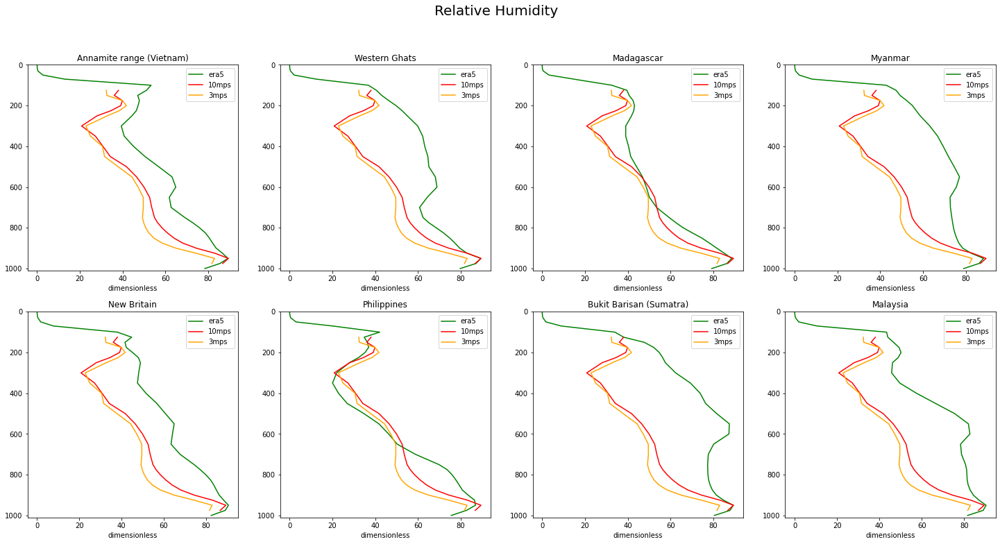

In [507]:
hrchannel10_RH = mpcalc.relative_humidity_from_mixing_ratio(np.array(hrchannel10_Q),np.array(hrchannel10_T)*units.degK,plevs*units.hPa)
hrchannel3_RH = mpcalc.relative_humidity_from_mixing_ratio(np.array(hrchannel3_Q),np.array(hrchannel3_T)*units.degK,plevs*units.hPa)

fig,ax = plt.subplots(2,4,figsize=(25,12))
ax=ax.reshape(-1)
for i,name in enumerate(mountains):
    rh = mpcalc.relative_humidity_from_mixing_ratio(np.array(mnthmean_skewtdata[name]['128_133_q']),np.array(mnthmean_skewtdata[name]['128_130_t'])*units.degK,np.array(mnthmean_skewtdata[name]['128_130_t'].level)*units.hPa)
    ax[i].plot(100*rh,mnthmean_skewtdata[name]['128_130_t'].level,color='g', label='era5')
    ax[i].plot(100*hrchannel10_RH,plevs,color='r', label='10mps')
    ax[i].plot(100*hrchannel3_RH ,plevs,color='orange', label='3mps')
    ax[i].set_ylim(1010,0)
    ax[i].set_title(mountains[name][1])
    ax[i].legend()
    
fig.suptitle("Relative Humidity", fontsize=20)


In [499]:
def mse_from_pt(q,T,p):
    g=9.81;Cp=1004.;Lv=2.26e6
    
    p = np.array(p)[::-1]
    pdim = p*units.hPa
    q = np.array(q)[::-1]
    T = np.array(T)[::-1]
    
    thicknesses = [mpcalc.thickness_hydrostatic(pdim, T*units.degK,bottom=pdim[i] ,depth=pdim[i]-pdim[i+1])/units.m for i in range(len(p)-1)]
    z = np.concatenate([[0.],np.cumsum(thicknesses)])
    
    return (Cp*T+Lv*q+g*z)[::-1]
    
hrchannel10_MSE = mse_from_pt(hrchannel10_Q,hrchannel10_T,plevs)
hrchannel3_MSE  = mse_from_pt(hrchannel3_Q ,hrchannel3_T ,plevs) 

Text(0.5, 0.98, 'MSE')

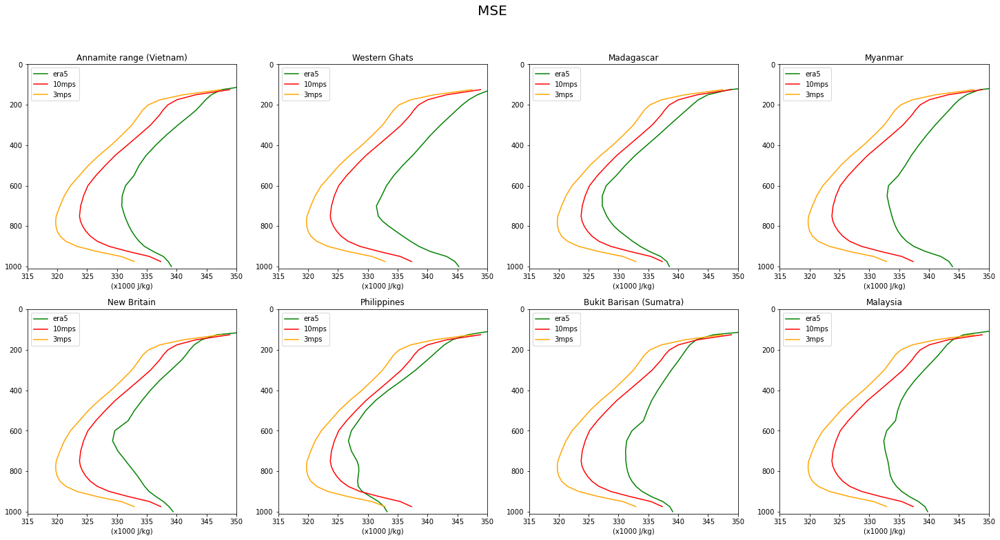

In [508]:
fig,ax = plt.subplots(2,4,figsize=(25,12))
ax=ax.reshape(-1)
for i,name in enumerate(mountains):
    mse = mse_from_pt(mnthmean_skewtdata[name]['128_133_q'],mnthmean_skewtdata[name]['128_130_t'],mnthmean_skewtdata[name]['128_130_t'].level)
    ax[i].plot(mse/1000,mnthmean_skewtdata[name]['128_130_t'].level,color='g', label='era5')
    ax[i].plot(hrchannel10_MSE/1000,plevs,color='r', label='10mps')
    ax[i].plot(hrchannel3_MSE /1000,plevs,color='orange', label='3mps')
    ax[i].set_ylim(1010,0)
    ax[i].set_xlim(315,350)
    ax[i].set_xlabel("(x1000 J/kg)")
    ax[i].set_title(mountains[name][1])
    ax[i].legend()
    
fig.suptitle("MSE", fontsize=20)

In [510]:
def extractwrfw(path):
    var = xr.open_dataarray(path)
    var=var.where(var > -1.)  
    return var.isel(west_east=slice(1600,1675)).mean('west_east')[1:-4][::-1]

hrchanneldry_W=extractwrfw("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountaindry.3km.300d/diags/wrf.W.days50-100.nc")
hrchannel10_W=extractwrfw("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km.300d/diags/wrf.W.days50-200.nc")
hrchannel3_W=extractwrfw("/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3mps.3km.300d/diags/wrf.W.days50-200.nc")


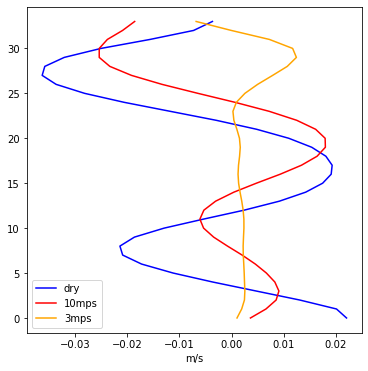

In [516]:
fig,ax = plt.subplots(1,1,figsize=(6,6))

ax.plot(hrchanneldry_W,range(len(hrchannel10_W)),color='blue', label='dry')
ax.plot(hrchannel10_W, range(len(hrchannel10_W)),color='r', label='10mps')
ax.plot(hrchannel3_W , range(len(hrchannel10_W)),color='orange', label='3mps')
ax.set_xlabel("m/s")
ax.legend()
    

## SSTs & RSSTs

In [571]:
for name in mountains:
    sst = spatial_mean(era5sst.sel(month=mountains[name][3]),box=mountains_upstream[name])
    tropmean = spatial_mean(era5sst.sel(month=mountains[name][3],latitude=slice(20,-20)))
    print("{:>11s} : {:.1f}".format(name,float(sst-tropmean)))
    

    vietnam : 1.1
      ghats : 1.8
 madagascar : 0.6
    myanmar : 1.8
 newbritain : 1.3
philippines : 0.2
    sumatra : 1.6
   malaysia : 1.3


In [578]:
%%time
era5t300= e5_climatology("128_130_t",years=range(2009,2015),level=300.)#2 yrs takes 20 sec

59.49715828895569
CPU times: user 47.7 s, sys: 12.8 s, total: 1min
Wall time: 1min


In [577]:
for name in mountains:
    t300 = spatial_mean(era5t300.sel(month=mountains[name][3]),box=mountains_upstream[name])
    tropmean = spatial_mean(era5t300.sel(month=mountains[name][3],latitude=slice(20,-20)))
    tropmin = era5t300.sel(month=mountains[name][3],latitude=slice(20,-20)).min()
    tropmax = era5t300.sel(month=mountains[name][3],latitude=slice(20,-20)).max()
    print("{:>11s} : {:.1f} / {:.1f} {:.1f}".format(name,float(t300-tropmean),float(tropmax-tropmean),float(tropmin-tropmean)))
    

    vietnam : 2.0 / 2.3 -4.4
      ghats : 2.3 / 4.4 -4.2
 madagascar : 0.0 / 2.3 -5.1
    myanmar : 2.0 / 5.1 -4.6
 newbritain : 1.3 / 5.1 -4.6
philippines : 1.0 / 2.3 -5.4
    sumatra : 1.1 / 1.8 -4.6
   malaysia : 1.6 / 1.8 -4.6


## Checking CIN upstream vs above

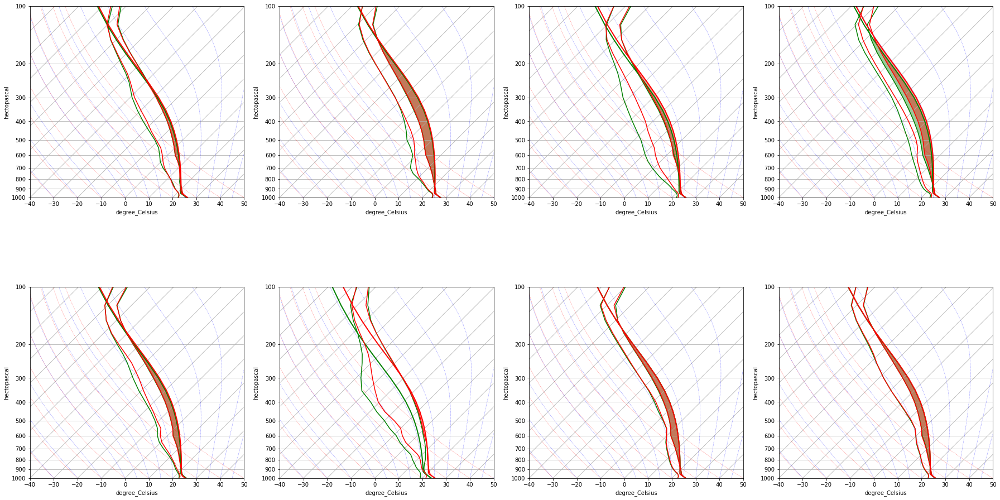

In [145]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore",RuntimeWarning)
    fig = plt.figure(figsize=(25,15))
    ax=ax.reshape(-1)
    for i,name in enumerate(mountains):
        skew = SkewT(fig, rotation=45,subplot=(2,4,i+1))
        skewtcape = plot_skewt(mnthmean_skewtu[name]['128_130_t'],mnthmean_skewtu[name]['128_133_q'],mnthmean_skewtu[name]['128_130_t'].level,skew,'green')
        skewtcape2 = plot_skewt(mnthmean_skewtd[name]['128_130_t'],mnthmean_skewtd[name]['128_133_q'],mnthmean_skewtd[name]['128_130_t'].level,skew,'red')
                
        skew.ax.set_ylim(1000, 100)
        skew.ax.set_xlim(-40, 50)
        skew.plot_dry_adiabats(linewidth=0.5)
        skew.plot_moist_adiabats(linewidth=0.5)
        #skew.ax.set_title(name + "| skewTCAPE=%i J/kg"%(mnthmean_skewtdata[name]['128_034_sstk'],mnthmean_skewtdata[name]['128_059_cape'],skewtcape),fontsize=12)
    fig.tight_layout()

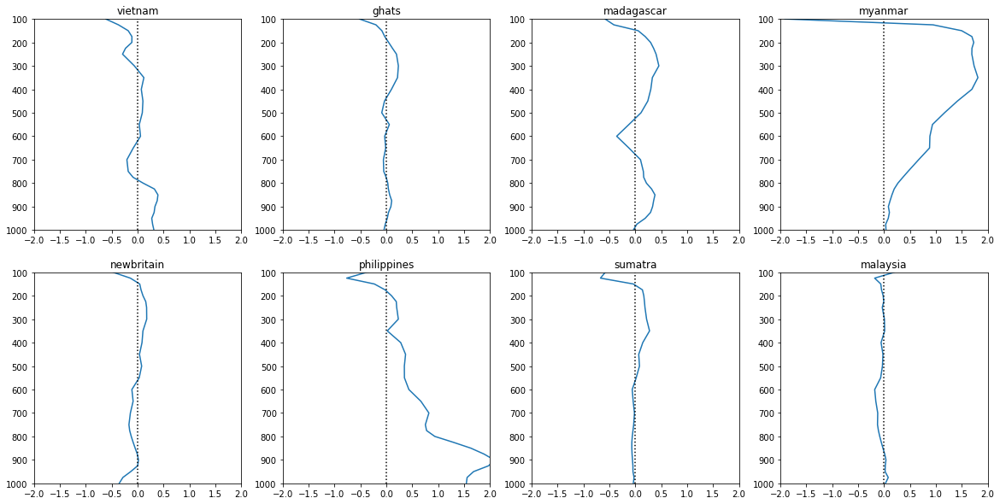

In [148]:
_,ax=plt.subplots(2,4,figsize=(20,10))
ax=ax.reshape(-1)
for i,name in enumerate(mountains):
    ax[i].plot(mnthmean_skewtd[name]['128_130_t']-mnthmean_skewtu[name]['128_130_t'],mnthmean_skewtu[name]['128_130_t'].level)
    ax[i].set_ylim(1000, 100)
    ax[i].set_title(name)
    ax[i].set_xlim(-2,2)
    ax[i].axvline(0.,linestyle=':',color='k')

# Daily data (extremes)

## Precip extremes

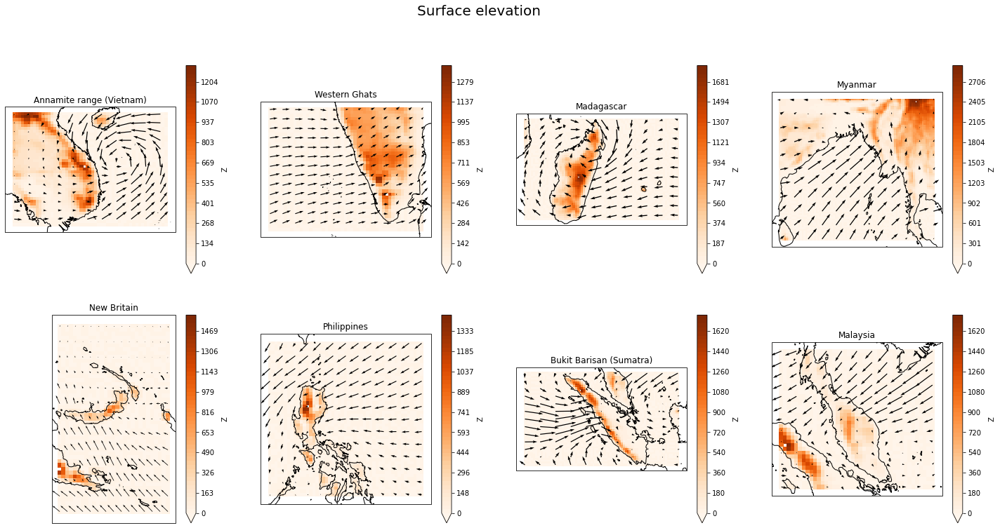

In [359]:
fig,ax = plt.subplots(2,4,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
ax = ax.reshape(-1)
i=0
for name,(box,lname,_,mnth) in mountains.items():
    ax[i].coastlines()
    window=orogm.sel(longitude=slice(box[0],box[1]),latitude=slice(box[3],box[2]))
    window.plot(ax=ax[i],transform=ccrs.PlateCarree(),cmap=plt.cm.Oranges,levels=np.linspace(0,window.max()))
    ax[i].set_title(lname)
    
    u=extreme_vars[name]["228_246_100u"]
    v=extreme_vars[name]["228_247_100v"]
    X = u.latitude.expand_dims({"longitude":u.longitude}).transpose()
    Y = u.longitude.expand_dims({"latitude":u.latitude})
    n=len(u.latitude)//10
    m=len(u.longitude)//10
    ax[i].quiver(np.array(Y)[::n,::m],np.array(X)[::n,::m], np.array(u)[::n,::m], np.array(v)[::n,::m], transform=ccrs.PlateCarree(),color="k")
    i+=1
    
    
fig.suptitle("Surface elevation",fontsize=20);None

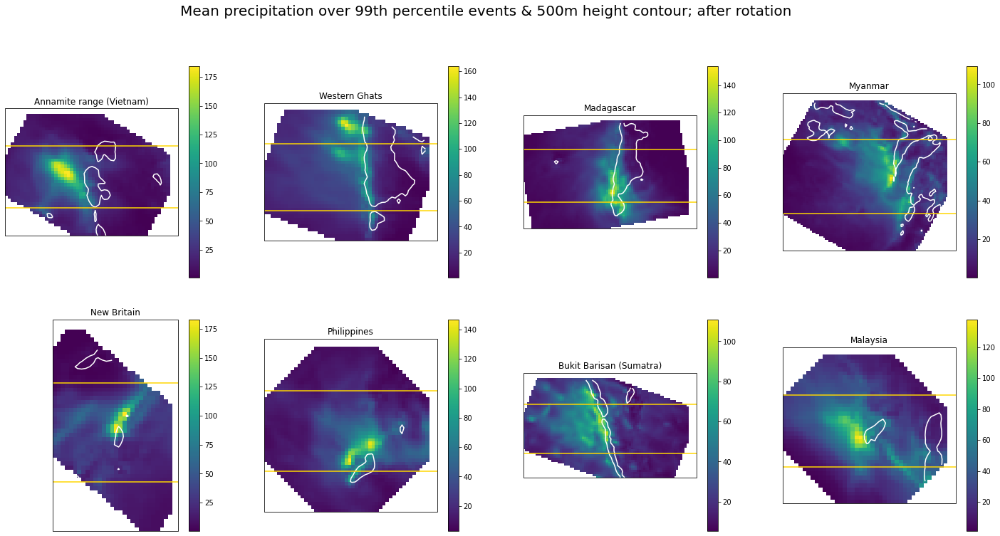

In [360]:
fig,ax = plt.subplots(2,4,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
ax = ax.reshape(-1)

for i,name in enumerate(mountains):
    im=ax[i].pcolormesh(extreme_vars_rotated[name]['128_228_tp'],cmap=plt.cm.viridis)
    ax[i].contour(mnthmean_vars_rotated[name]['128_129_z'],**{'levels':[500],'colors':['w']})
    ax[i].set_title(mountains[name][1])
    n=len(mnthmean_vars_rotated[name]['128_129_z'])
    ax[i].axhline(n//4,color="gold")
    ax[i].axhline(3*n//4,color="gold")
    fig.colorbar(im, ax=ax[i])
    
fig.suptitle("Mean precipitation over 99th percentile events & 500m height contour; after rotation",fontsize=20);None

## Upslope flow extremes

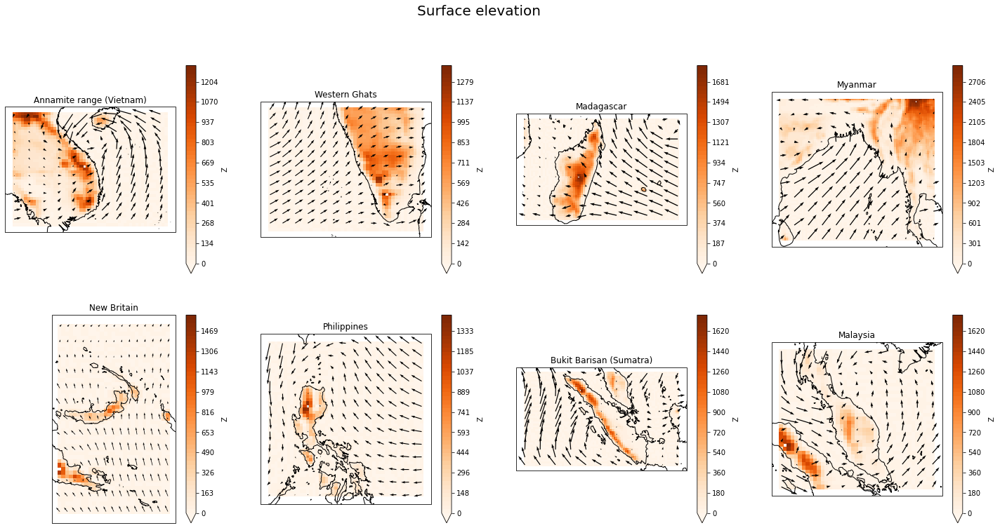

In [361]:
fig,ax = plt.subplots(2,4,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
ax = ax.reshape(-1)
i=0
for name,(box,lname,_,mnth) in mountains.items():
    ax[i].coastlines()
    window=orogm.sel(longitude=slice(box[0],box[1]),latitude=slice(box[3],box[2]))
    window.plot(ax=ax[i],transform=ccrs.PlateCarree(),cmap=plt.cm.Oranges,levels=np.linspace(0,window.max()))
    ax[i].set_title(lname)
    
    u=upsextreme_vars[name]["228_246_100u"]
    v=upsextreme_vars[name]["228_247_100v"]
    X = u.latitude.expand_dims({"longitude":u.longitude}).transpose()
    Y = u.longitude.expand_dims({"latitude":u.latitude})
    n=len(u.latitude)//10
    m=len(u.longitude)//10
    ax[i].quiver(np.array(Y)[::n,::m],np.array(X)[::n,::m], np.array(u)[::n,::m], np.array(v)[::n,::m], transform=ccrs.PlateCarree(),color="k")
    i+=1
    
    
fig.suptitle("Surface elevation",fontsize=20);None

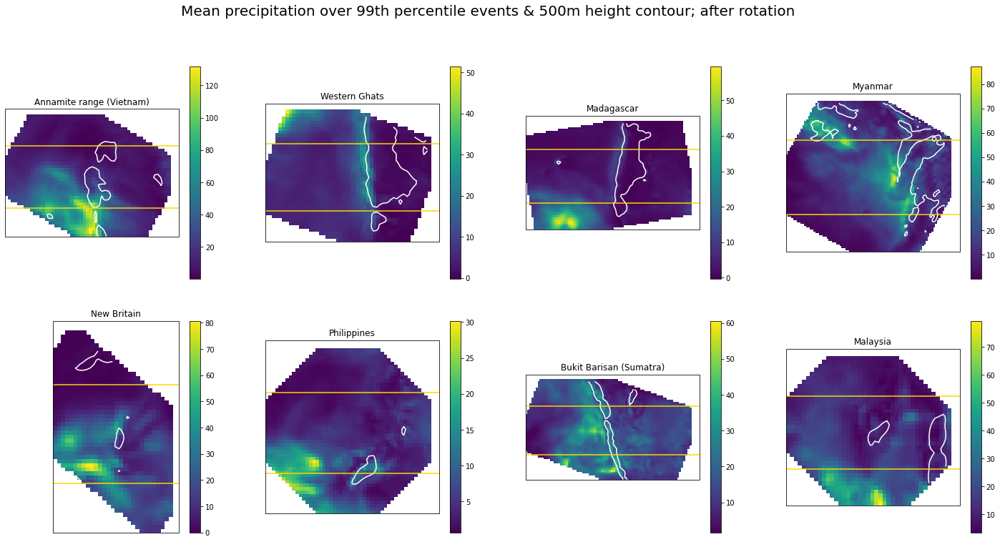

In [362]:
fig,ax = plt.subplots(2,4,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
ax = ax.reshape(-1)

for i,name in enumerate(mountains):
    im=ax[i].pcolormesh(upsextreme_vars_rotated[name]['128_228_tp'],cmap=plt.cm.viridis)
    ax[i].contour(mnthmean_vars_rotated[name]['128_129_z'],**{'levels':[500],'colors':['w']})
    ax[i].set_title(mountains[name][1])
    n=len(mnthmean_vars_rotated[name]['128_129_z'])
    ax[i].axhline(n//4,color="gold")
    ax[i].axhline(3*n//4,color="gold")
    fig.colorbar(im, ax=ax[i])
    
fig.suptitle("Mean precipitation over 99th percentile events & 500m height contour; after rotation",fontsize=20);None

# Comparison

## Precip

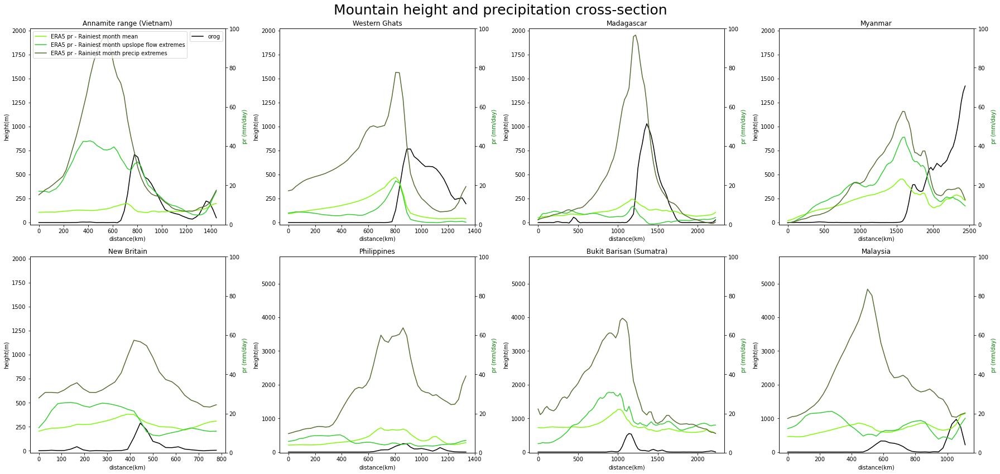

In [363]:
km_per_degreelat = 6370*np.pi/180
fig,ax = plt.subplots(2,4,figsize=(25,12))
ax = ax.reshape(-1)
for i,name in enumerate(mountains):
    ax[i].set_title(mountains[name][1])

    n,m=mnthmean_vars_rotated[name]['128_129_z'].shape
    ax[i].plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],np.nanmean(mnthmean_vars_rotated[name]['128_129_z'][n//4:3*n//4,:],axis=0),color='k',label='orog')
    ax[i].set_xlabel("distance(km)")
    ax[i].set_ylabel("height(m)")

    ax2=ax[i].twinx()
    ax2.set_ylabel('pr (mm/day)', color='g')

    n,m=mnthmean_vars_rotated[name]['128_228_tp'].shape
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],np.nanmean(mnthmean_vars_rotated[name]['128_228_tp'][n//4:3*n//4,:],axis=0),color='lawngreen',label='ERA5 pr - Rainiest month mean')
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],np.nanmean(upsextreme_vars_rotated[name]['128_228_tp'][n//4:3*n//4,:],axis=0),color='limegreen',label='ERA5 pr - Rainiest month upslope flow extremes')
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],np.nanmean(extreme_vars_rotated[name]['128_228_tp'][n//4:3*n//4,:],axis=0),color='darkolivegreen',label='ERA5 pr - Rainiest month precip extremes')
    

    if i == 0:
        ax[i].legend()
        ax2.legend(loc="upper left")
    if i < 5:
        ax[i].set_ylim(-20,2020)
    else:
        ax[i].set_ylim(-20,5800)
    ax2.set_ylim(0,100)
        
fig.suptitle("Mountain height and precipitation cross-section",fontsize=25)
fig.tight_layout()



## CAPE

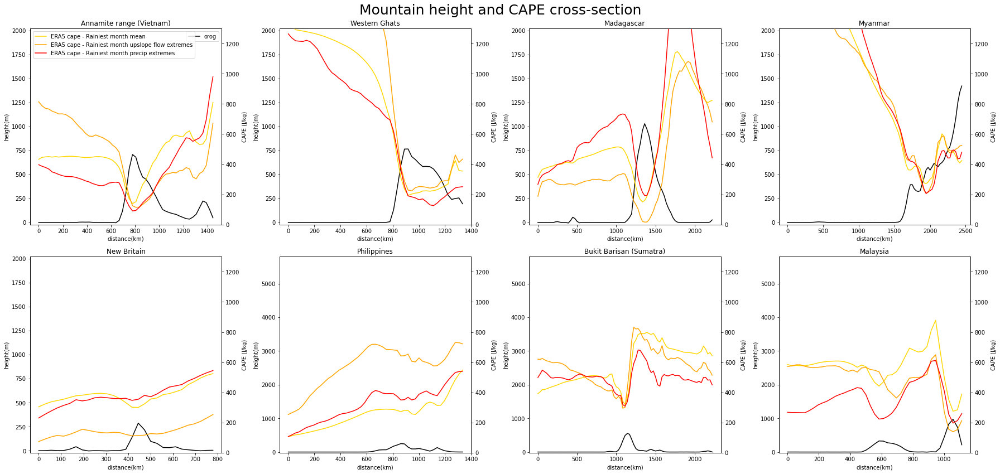

In [364]:
km_per_degreelat = 6370*np.pi/180
fig,ax = plt.subplots(2,4,figsize=(25,12))
ax = ax.reshape(-1)
for i,name in enumerate(mountains):
    ax[i].set_title(mountains[name][1])

    n,m=mnthmean_vars_rotated[name]['128_129_z'].shape
    ax[i].plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],np.nanmean(mnthmean_vars_rotated[name]['128_129_z'][n//4:3*n//4,:],axis=0),color='k',label='orog')
    ax[i].set_xlabel("distance(km)")
    ax[i].set_ylabel("height(m)")

    ax2=ax[i].twinx()
    ax2.set_ylabel('CAPE (J/kg)', color='k')

    n,m=mnthmean_vars_rotated[name]['128_059_cape'].shape
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],np.nanmean(mnthmean_vars_rotated[name]['128_059_cape'][n//4:3*n//4,:],axis=0),color='gold',label='ERA5 cape - Rainiest month mean')
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],np.nanmean(upsextreme_vars_rotated[name]['128_059_cape'][n//4:3*n//4,:],axis=0),color='orange',label='ERA5 cape - Rainiest month upslope flow extremes')
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],np.nanmean(extreme_vars_rotated[name]['128_059_cape'][n//4:3*n//4,:],axis=0),color='red',label='ERA5 cape - Rainiest month precip extremes')
    

    if i == 0:
        ax[i].legend()
        ax2.legend(loc="upper left")
    if i < 5:
        ax[i].set_ylim(-20,2020)
    else:
        ax[i].set_ylim(-20,5800)
    ax2.set_ylim(0,1300)
        
fig.suptitle("Mountain height and CAPE cross-section",fontsize=25)
fig.tight_layout()



## Convective timescale

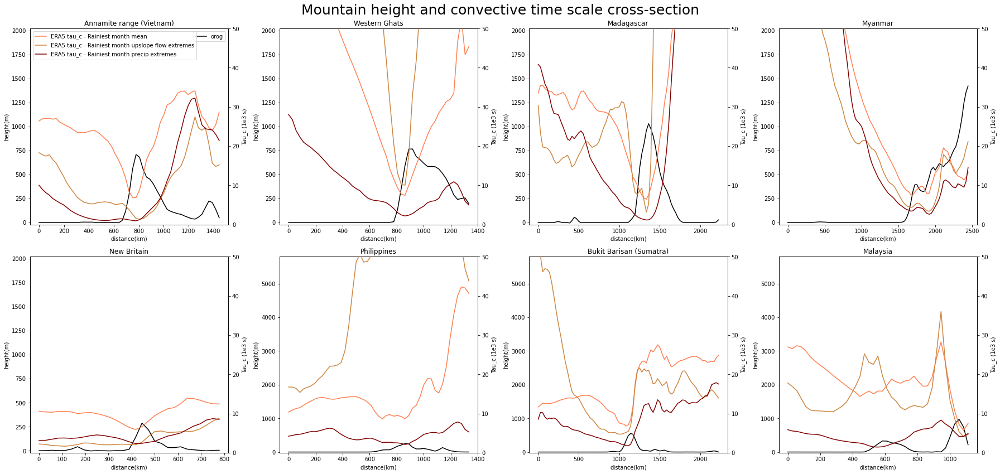

In [365]:
km_per_degreelat = 6370*np.pi/180
fig,ax = plt.subplots(2,4,figsize=(25,12))
ax = ax.reshape(-1)
for i,name in enumerate(mountains):
    ax[i].set_title(mountains[name][1])

    n,m=mnthmean_vars_rotated[name]['128_129_z'].shape
    ax[i].plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],np.nanmean(mnthmean_vars_rotated[name]['128_129_z'][n//4:3*n//4,:],axis=0),color='k',label='orog')
    ax[i].set_xlabel("distance(km)")
    ax[i].set_ylabel("height(m)")

    ax2=ax[i].twinx()
    ax2.set_ylabel('Tau_c (1e3 s)', color='k')

    n,m=mnthmean_vars_rotated[name]['128_059_cape'].shape
    
    pr = np.nanmean(mnthmean_vars_rotated[name]['128_228_tp'][n//4:3*n//4,:],axis=0)
    cape = np.nanmean(mnthmean_vars_rotated[name]['128_059_cape'][n//4:3*n//4,:],axis=0)
    factor = 2.26e6/(86400*1e4) #convert pr to J/kg / s : convert to mm/s, multiply by Lv, divide by atmospheric mass
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],1/(1000*factor)*np.nanmean(mnthmean_vars_rotated[name]['128_059_cape'][n//4:3*n//4,:],axis=0)                      /np.nanmean(mnthmean_vars_rotated[name]['128_228_tp'][n//4:3*n//4,:],axis=0)                      ,color='coral',label='ERA5 tau_c - Rainiest month mean')
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],1/(1000*factor)*np.nanmean(upsextreme_vars_rotated[name]['128_059_cape'][n//4:3*n//4,:],axis=0)/np.nanmean(upsextreme_vars_rotated[name]['128_228_tp'][n//4:3*n//4,:],axis=0),color='peru',label='ERA5 tau_c - Rainiest month upslope flow extremes')
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m],1/(1000*factor)*np.nanmean(extreme_vars_rotated[name]['128_059_cape'][n//4:3*n//4,:],axis=0) /np.nanmean(extreme_vars_rotated[name]['128_228_tp'][n//4:3*n//4,:],axis=0) ,color='maroon',label='ERA5 tau_c - Rainiest month precip extremes')
    

    if i == 0:
        ax[i].legend()
        ax2.legend(loc="upper left")
    if i < 5:
        ax[i].set_ylim(-20,2020)
    else:
        ax[i].set_ylim(-20,5800)
    ax2.set_ylim(0,50)
        
fig.suptitle("Mountain height and convective time scale cross-section",fontsize=25)
fig.tight_layout()



## Mass flux cross-section

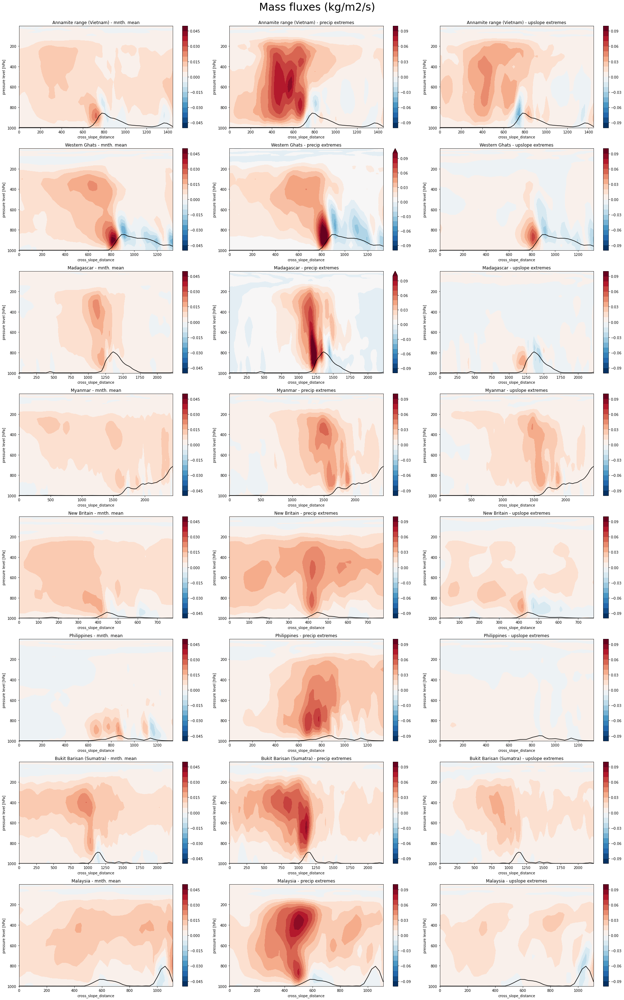

In [411]:
levelss=[np.arange(-0.05,0.051,0.005),np.arange(-0.1,0.11,0.01),np.arange(-0.1,0.11,0.01)]

fig,ax = plt.subplots(len(mountains),3,figsize=(25,5*len(mountains)))
for i,name in enumerate(mountains):
    omega_rot=rotate3d(mnthmean_3dvars[name]['128_135_w'],mountains[name][2])
    
    p,n,m = omega_rot.shape
    x=np.arange(0,10000,0.25*km_per_degreelat)[:m]
    
    for j,mf in enumerate([omega_rot,extreme_vars_rotated[name]['128_135_w'],upsextreme_vars_rotated[name]['128_135_w']]):
        omega_xz = xr.DataArray(np.nanmean(mf[:,n//4:3*n//4,:],axis=1),
                                   dims  ={'level':mnthmean_3dvars[name]['128_135_w'].level,'cross_slope_distance':x},
                                   coords={'level':mnthmean_3dvars[name]['128_135_w'].level,'cross_slope_distance':x})
        
        (-omega_xz/9.81).plot.contourf(ax=ax[i][j],yincrease=False,levels=levelss[j])
    
    
    
    
    for a,desc in zip(ax[i],[" - mnth. mean"," - precip extremes"," - upslope extremes"]):
        n,m=mnthmean_vars_rotated[name]['128_129_z'].shape
        a.plot(x,999-np.nanmean(mnthmean_vars_rotated[name]['128_129_z'][n//4:3*n//4,:],axis=0)/5,color='k')   
        a.set_title(mountains[name][1]+desc)

fig.suptitle("Mass fluxes (kg/m2/s)",fontsize=30)
fig.tight_layout(rect=[0, 0, 1, 0.98])

# q-T analytical model test

In [12]:
def plot_xz_anom(vardict,mountains,levels=None,description="",labels=False,title=""): 
    fig,ax = plt.subplots(2,4,figsize=(25,11))
    ax=ax.reshape(-1)
    for i,name in enumerate(mountains):
        var_rot=rotate3d(vardict[name],mountains[name][2])
        
        p,n,m = var_rot.shape
        
        x=np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i]
        var_xz = xr.DataArray(np.nanmean(var_rot[:,n//4:3*n//4,:],axis=1),
                                  dims  ={'level':vardict[name].level,'Cross-slope distance (km)':x},
                                  coords={'level':vardict[name].level,'Cross-slope distance (km)':x})
        var_xz=var_xz-var_xz.isel({'Cross-slope distance (km)':range(0,10)}).mean('Cross-slope distance (km)')
        if i%4!=3:
            contourf=var_xz.plot.contourf(ax=ax[i],yincrease=False,levels=levels,add_colorbar=False)
        else:
            contourf=var_xz.plot.contourf(ax=ax[i],yincrease=False,levels=levels)
        if labels:
            ax[i].clabel(contourf, inline=False, fontsize=8, fmt="%i",colors='k')
        
        n,m=mnthmean_vars_rotated[name]['128_129_z'].shape
        ax[i].plot(x,999-np.nanmean(mnthmean_vars_rotated[name]['128_129_z'][n//4:3*n//4,:],axis=0)/10,color='k')   
        ax[i].set_title(mountains[name][1]+description)
    fig.suptitle(title,fontsize=18)
    fig.subplots_adjust(top=0.93)


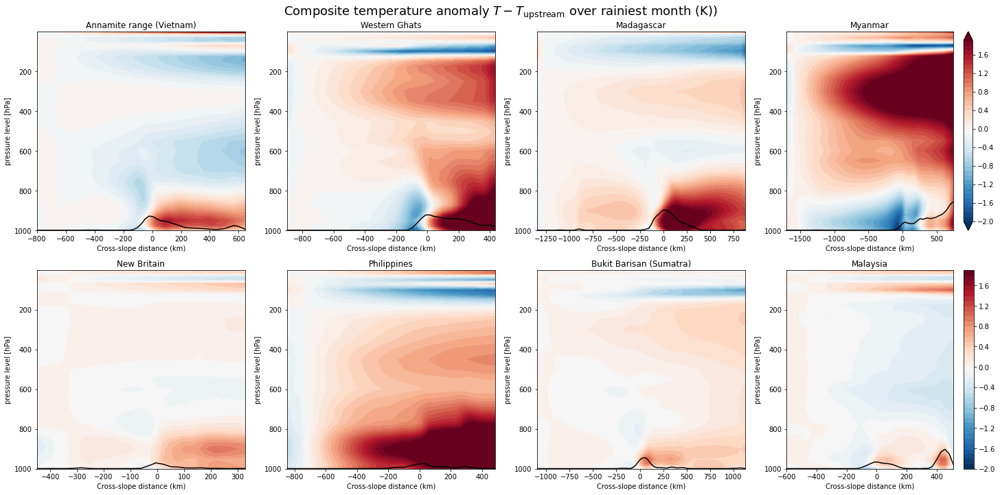

In [13]:
plot_xz_anom({name :mnthmean_3dvars[name]['128_130_t'] for name in mountains},mountains,description="",levels=np.arange(-2,2,0.1), title = r"Composite temperature anomaly $T-T_{\mathrm{upstream}}$ over rainiest month (K))")

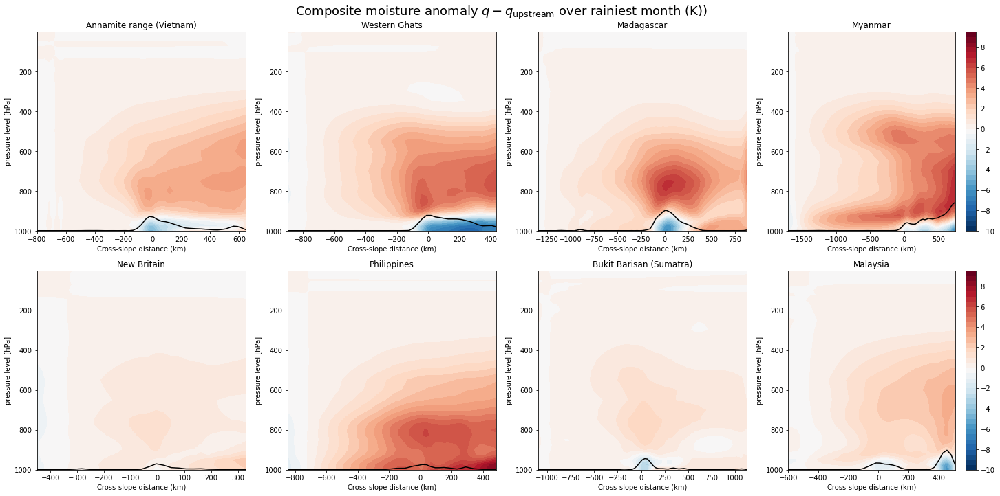

In [14]:
plot_xz_anom({name :mnthmean_3dvars[name]['128_133_q']*2.5e6/1004. for name in mountains},mountains,description="",levels=np.arange(-10,10,0.5), title = r"Composite moisture anomaly $q-q_{\mathrm{upstream}}$ over rainiest month (K))")

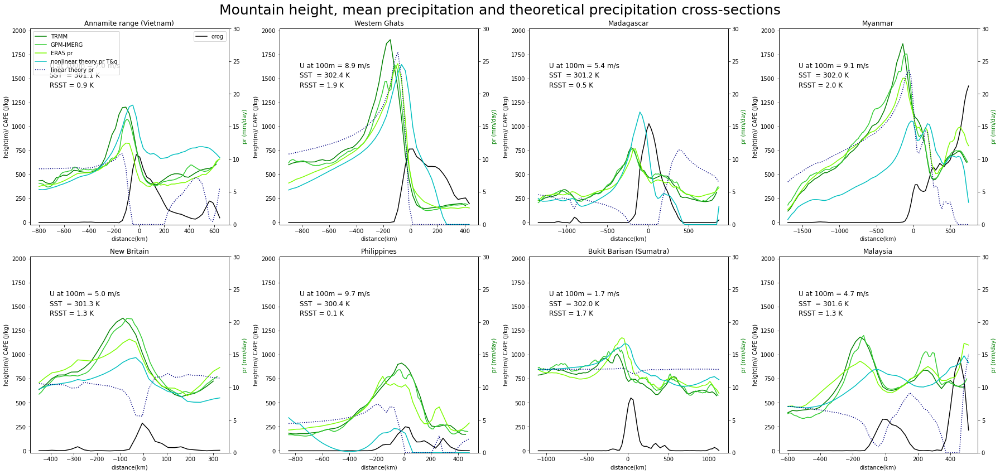

In [22]:
fig,ax=set_plots(mountains)
mountaintops=[800.,900.,1350.,1700.,450.,850.,1100.,600.]
for i,name in enumerate(mountains):
    ax2=ax[i].twinx()
    ax2.set_ylabel('pr (mm/day)', color='g')
    
    # Plot TRMM pr
    n,m=mnthmean_vars_rotated[name]['trmmpr'].shape
    trmmp = np.nanmean(mnthmean_vars_rotated[name]['trmmpr'][n//4:3*n//4,:],axis=0)
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],trmmp,'g',label='TRMM')
    
    # Plot GPM pr
    n,m=mnthmean_vars_rotated[name]['gpm_pr'].shape
    gpmp = np.nanmean(mnthmean_vars_rotated[name]['gpm_pr'][n//4:3*n//4,:],axis=0)
    ax2.plot(np.arange(0,10000,0.1*km_per_degreelat)[:m]-mountaintops[i],gpmp,'limegreen',label='GPM-IMERG')
        
    # Plot ERA5 pr
    n,m=mnthmean_vars_rotated[name]['128_228_tp'].shape
    e5p= np.nanmean(mnthmean_vars_rotated[name]['128_228_tp'][n//4:3*n//4,:],axis=0)
    ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],e5p,color='lawngreen',label='ERA5 pr')
    #e5e=-np.nanmean(mnthmean_vars_rotated[name]['128_182_e'][n//4:3*n//4,:],axis=0)
    #ax2.plot(np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i],e5e,color='dodgerblue',label='ERA5 evap')
    
    # define grid, compute upstream wind
    x=np.arange(0,10000,0.25*km_per_degreelat)[:m]-mountaintops[i]
    b = int((mountaintops[i]-500)/(0.25*km_per_degreelat))
    a = int((mountaintops[i]-750)/(0.25*km_per_degreelat))
    
    if a<=0:
        a=0
        b = int((mountaintops[i]-300)/(0.25*km_per_degreelat))
    u0=np.nanmean(np.maximum(mnthmean_vars_rotated[name]['uperp'][n//4:3*n//4,a:b],0.))
    if i==4:
        u0=5.
        
    # Compute t and q deviations
    t_q=[0,0]
    for j,vname in enumerate(('128_130_t','128_133_q')):
        temp=mnthmean_3dvars[name][vname]
        var_rot = rotate3d(temp,mountains[name][2])
        var = xr.DataArray(np.nanmean(var_rot[:,n//4:3*n//4,:],axis=1),
                                  dims  ={'level':temp.level,'cross_slope_distance':x},
                                  coords={'level':temp.level,'cross_slope_distance':x})
        t_q[j]=(var-var.isel({'cross_slope_distance':range(0,10)}).mean('cross_slope_distance')).sel(level=slice(700,900)).mean('level')
    TdL,qdL=t_q
    qdL*=2.5e6/1004.
    P0=e5p[0]
    
    # Compute precip predicted by nonlinear theory
    #pr_nonlinear = nonlinear_precip_theory(1000*x,TdL,0*TdL,u0,tauT=7.5,tauq=27.5,P0=P0)
    #ax2.plot(x,pr_nonlinear,color='b',label='nonlinear theory pr, T only')
    pr_nonlinear = nonlinear_precip_theory(1000*x,TdL,qdL,u0,tauT=7.5,tauq=27.5,P0=P0)
    ax2.plot(x,pr_nonlinear,color='c',label='nonlinear theory pr T&q')
    
    # Compute precip predicted by linear theory
    hx=np.nanmean(mnthmean_vars_rotated[name]['128_129_z'][n//4:3*n//4,:],axis=0)
    npad=20
    dx=x[1]-x[0]
    xp=np.pad(x,npad,mode="linear_ramp",end_values=(x[0]-npad*dx,x[-1]+npad*dx))
    pr_linear = linear_precip_theory(1000*xp,np.pad(hx,npad,mode="linear_ramp",end_values=(0,)),u0,tauT=7.5,tauq=27.5,P0=P0)
    ax2.plot(x,pr_linear[npad:-npad],color='navy',linestyle=':',label='linear theory pr')
    
    
    if i == 0:
        ax[i].legend()
        ax2.legend(loc="upper left")
    ax2.set_ylim(0,30)
    
    ax2.text(0.1, 0.8,'U at 100m = %.1f m/s'%u0, transform=ax2.transAxes, fontsize=12)
    sst = spatial_mean(era5sst.sel(month=mountains[name][3]),box=mountains_upstream[name])
    tropmean = spatial_mean(era5sst.sel(month=mountains[name][3],latitude=slice(20,-20)))
    ax2.text(0.1, 0.75,'SST  = %.1f K'%float(sst), transform=ax2.transAxes, fontsize=12)
    ax2.text(0.1, 0.7, 'RSST = %.1f K'%float(sst-tropmean), transform=ax2.transAxes, fontsize=12)
    ax[i].set_title(mountains[name][1])
fig.suptitle("Mountain height, mean precipitation and theoretical precipitation cross-sections",fontsize=25)
fig.tight_layout()



# Seasonality in all regions

In [4]:
precip_boxes = {"vietnam"    :[107  ,  19  , 110.5, 14   ,2  ],
                "ghats"      :[ 75  ,   9  ,  72.5, 16   ,2  ],
                "madagascar" :[ 52  , -14.5,  49  , -24.5,2.5],
                "myanmar"    :[ 98  ,  11  ,  90  , 21   ,4  ],
                "newbritain" :[154  , - 6  , 150  , -8   ,2  ],
                "philippines":[123.5,  19  , 127  , 11   ,3  ],
                "sumatra"    :[ 98.5, - 2  ,  96  , 2    ,2.5],
                "malaysia"   :[100.5,  10  , 105  , 4    ,2  ],
               }

In [5]:
def tilted_rect(grid,x1,y1,x2,y2,width,reverse=False):
    x = grid.longitude
    y = grid.latitude
    if reverse:
        halfplane_para = (x-x1)*(y2-y1) - (x2-x1)*(y-y1) <=0
    else:
        halfplane_para = (x-x1)*(y2-y1) - (x2-x1)*(y-y1) >=0
    sc_prod = (x-x1)*(x2-x1)+(y-y1)*(y2-y1)
    halfplane_perp_up = sc_prod >= 0
    halfplane_perp_dn = (x-x2)*(x1-x2)+(y-y2)*(y1-y2) >= 0
    distance_across = np.sqrt((x-x1)**2+(y-y1)**2 - sc_prod**2/((x2-x1)**2+(y2-y1)**2))
    return (halfplane_para*halfplane_perp_up*halfplane_perp_dn*(distance_across<width)).transpose('latitude','longitude')
def crossslopeflow(u,v,angle):
    return (u*np.sin(angle*np.pi/180)+v*np.cos(angle*np.pi/180))

In [6]:
trmmpr=xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/TRMM-seasonalmean-20006-201312.nc")
gpm_pr=xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/GPM-IMERG-seasonalmean-20006-201312.nc")
era5100u =    e5_climatology("*_100u",     years=range(2000,2014))
era5100v =    e5_climatology("*_100v",     years=range(2000,2014))

4.868789911270142
4.99449610710144


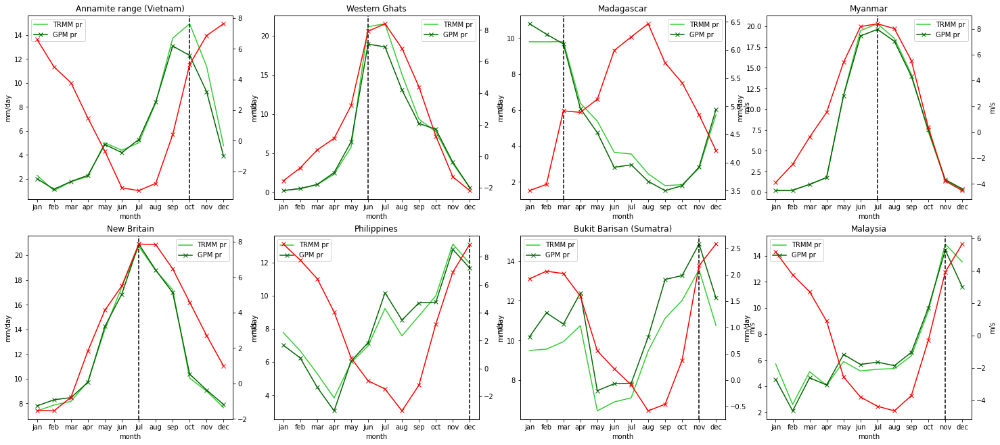

In [15]:
#trmmprs={name:0 for name in mountains}
#gpm_prs={name:0 for name in mountains}
#crossslopes={name:0 for name in mountains}
fig,ax = plt.subplots(2,4,figsize=(25,11))
ax = ax.reshape(-1)
for i,name in enumerate(mountains):
    #mask_trmm = tilted_rect(trmmpr,*precip_boxes[name])
    #mask_gpm  = tilted_rect(gpm_pr,*precip_boxes[name])
    #mask_era5 = tilted_rect(era5100u,*precip_boxes[name],reverse=True)
    #trmmprs[name] = spatial_mean(trmmpr,mask=mask_trmm).load()
    #gpm_prs[name] = spatial_mean(gpm_pr,mask=mask_gpm).load()
    #crossslopes[name] = crossslopeflow(spatial_mean(era5100u,mask=mask_era5),spatial_mean(era5100v,mask=mask_era5),mountains[name][2]).load()
    
    ax2=ax[i].twinx()

    trmmprs[name].plot(ax=ax[i],color='limegreen',label='TRMM pr')
    gpm_prs[name].plot(ax=ax[i],color='darkgreen',label='GPM pr',marker='x')
    crossslopes[name].plot(ax=ax2,color='red',label='cross-slope flow',marker='x')
    ax[i].axvline(mountains[name][3],color='k',linestyle='--')
    
    ax[i].set_ylabel('mm/day')
    ax2.set_ylabel('m/s')
    ax[i].set_xticks(range(1,13))
    ax[i].set_xticklabels(mnths)
    ax[i].set_title(mountains[name][1])
    ax[i].legend()